In [337]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [338]:
from wordcloud import WordCloud, STOPWORDS
from sklearn.feature_extraction.text import CountVectorizer
from collections import Counter

In [339]:
df_amazon = pd.read_excel("/content/drive/MyDrive/amazon_redmi_note_10_pro_20220920.xlsx")
df_amazon.head()

,Dates,Reviews,Ratings
0,2021-07-16,Since my OnePlus 7 conked off out of nowhere o...,5
1,2021-06-08,Bought this smartphone for a discount of 17500...,4
2,2022-09-11,"Got this phone for 15,499 on Amazon. It's a de...",4
3,2022-09-09,The phone is overall quite good but only one m...,4
4,2022-07-27,I am writing this review after one week of usa...,4


In [340]:
df_amazon.shape

(590, 3)

In [341]:
df_amazon.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 590 entries, 0 to 589
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Dates    590 non-null    datetime64[ns]
 1   Reviews  564 non-null    object        
 2   Ratings  590 non-null    int64         
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 14.0+ KB


In [342]:
df_amazon["Ratings"].value_counts()

4    309
5    191
3     87
1      2
2      1
Name: Ratings, dtype: int64

In [343]:
df_amazon_new = df_amazon[~df_amazon["Reviews"].isnull()]
df_amazon_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 564 entries, 0 to 589
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Dates    564 non-null    datetime64[ns]
 1   Reviews  564 non-null    object        
 2   Ratings  564 non-null    int64         
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 17.6+ KB


In [344]:
df_amazon_new["Ratings"].value_counts()

4    294
5    182
3     85
1      2
2      1
Name: Ratings, dtype: int64

In [345]:
df_amazon_new["Ratings"].isnull().sum()

0

In [346]:
only_reviews = " ".join(df_amazon_new.Reviews)

#removing punctuations

In [347]:
only_reviews = re.sub(r'[^\w\s]','',only_reviews)

In [348]:
only_reviews

'Since my OnePlus 7 conked off out of nowhere one fine day I was forced to scout for a new phone on a very short term basis Because of this I had to move from a phone in the budget premium segment to a higher trim phone within the midrange segment I will be writing this review from this perspective I have been using this phone as my main device since the 4th of July and Ive written this review after using this phone for a little under two weeksOne of the biggest things that got my eye was the beautiful Samsung AMOLED display It is on par with if not better than my older OnePlus 7 The blacks are beautiful and I could tell that MI did not skimp out on this segment However I do feel that their touch sensor could use some improvement as I find myself mistouching a lot of buttons on it Also the screen tends to have a significant flashing problem especially during the night While I dont think this is a very frequent issue do keep this in mind when making a purchase Another great thing about 

# WordClouds

In [349]:
wc = WordCloud(width = 1200, height=800,max_words=200,background_color="white",stopwords=STOPWORDS)
wc

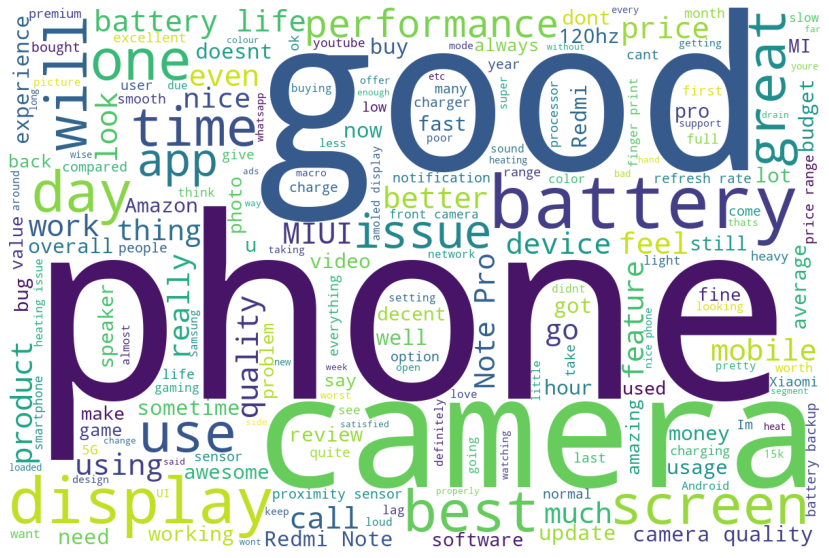

In [350]:
plt.figure(figsize=(15,10))
plt.imshow(wc.generate_from_text(only_reviews))
plt.axis("off")
plt.show()

In [351]:
print(STOPWORDS)

{'is', "i'm", 'r', 'all', "they'd", "we'll", 'a', 'both', 'each', 'own', 'and', 'would', 'in', "there's", 'ourselves', 'had', "they're", 'doing', 'when', 'these', "you'd", "they've", "we've", 'yours', 'no', 'with', 'where', 'if', "how's", 'was', 'hers', 'cannot', 'theirs', "why's", "you'll", 'are', 'above', 'been', "didn't", "here's", 'him', 'therefore', 'below', "she's", "hadn't", 'before', "i've", 'such', "you're", "haven't", 'about', 'they', 'we', "we'd", 'yourself', 'between', 'against', "weren't", 'again', 'only', 'you', 'which', 'at', 'shall', 'hence', 'because', "he'd", 'she', 'itself', "wouldn't", 'me', 'most', 'more', 'until', 'herself', 'through', 'com', 'else', 'her', 'here', 'few', 'than', 'himself', 'he', 'those', "shan't", 'on', 'over', 'their', "they'll", 'who', 'its', 'so', 'like', 'yourselves', 'what', 'should', "what's", 'this', 'just', 'up', 'same', 'any', 'ought', 'also', 'myself', 'into', 'how', 'do', 'why', 'off', "i'll", "he'll", 'as', 'your', 'of', 'did', "i'd",

In [352]:
len(STOPWORDS)

192

In [353]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [354]:
stopwords = nltk.corpus.stopwords.words('english')
print(len(stopwords))
newStopWords = ['phone','Redmi',"Amazon","redmi", "note" ,"pro","Flipkart"]
stopwords.extend(newStopWords)
print(len(stopwords))

179
186


In [355]:
len(stopwords)

186

In [356]:
print(stopwords)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

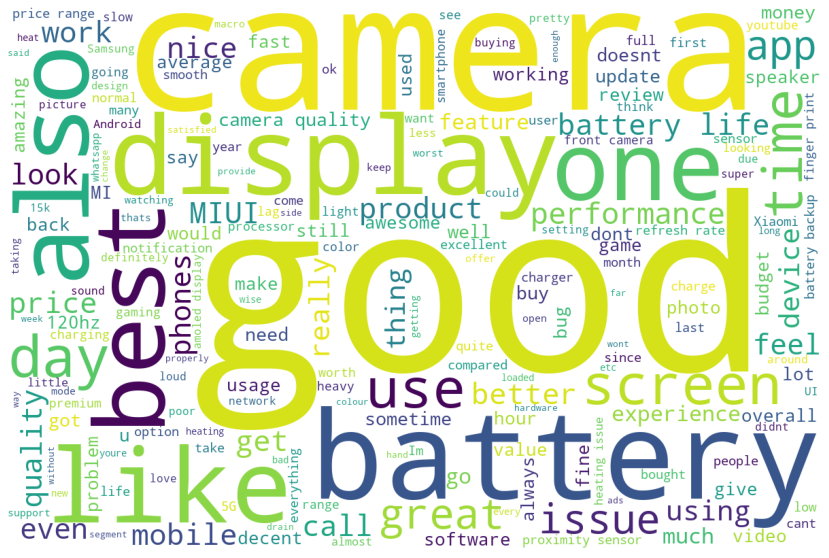

In [357]:
wc = WordCloud(width = 1200, height=800,max_words=200,background_color="white",stopwords=stopwords)
plt.figure(figsize=(15,10))
plt.imshow(wc.generate_from_text(only_reviews))
plt.axis("off")
plt.show()

In [358]:
tf = CountVectorizer(token_pattern="[a-z]+",max_df=0.80,min_df=10,stop_words=stopwords,ngram_range=(2,2))

In [359]:
tf_mat = tf.fit_transform(df_amazon_new.Reviews)
tf_mat

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['amazon', 'flipkart'] not in stop_words.
  % sorted(inconsistent)


<564x29 sparse matrix of type '<class 'numpy.int64'>'
	with 512 stored elements in Compressed Sparse Row format>

In [360]:
tf.vocabulary_

{'amoled display': 1,
 'refresh rate': 26,
 'good price': 16,
 'battery life': 3,
 'price range': 23,
 'fingerprint sensor': 12,
 'good battery': 14,
 'day day': 8,
 'proximity sensor': 24,
 'life good': 20,
 'also good': 0,
 'good product': 17,
 'camera good': 5,
 'display good': 9,
 'overall good': 22,
 'good camera': 15,
 'front camera': 13,
 'battery backup': 2,
 'camera battery': 4,
 'value money': 28,
 'hz refresh': 19,
 'camera quality': 6,
 'stereo speakers': 27,
 'quality good': 25,
 'finger print': 10,
 'fingerprint reader': 11,
 'media could': 21,
 'could loaded': 7,
 'heating issue': 18}

In [361]:
word_freq = tf_mat.sum(axis=0)[0]

In [362]:
word_freq

matrix([[17, 16, 21, 68, 11, 20, 42, 10, 12, 12, 17, 11, 12, 17, 17, 19,
         13, 10, 13, 15, 12, 10, 19, 29, 25, 27, 23, 12, 25]])

In [363]:
word_freq.shape

(1, 29)

In [364]:
word_freq=np.array(word_freq).reshape(tf_mat.shape[1],)
word_freq

array([17, 16, 21, 68, 11, 20, 42, 10, 12, 12, 17, 11, 12, 17, 17, 19, 13,
       10, 13, 15, 12, 10, 19, 29, 25, 27, 23, 12, 25])

In [365]:
word_freq[6]

42

In [366]:
tf_vocab_reverse = {v:k for k,v in tf.vocabulary_.items()}
tf_vocab_reverse[2]

'battery backup'

In [367]:
word_freq_dict={}
for k,v in tf.vocabulary_.items():
    v = word_freq[v]
    word_freq_dict[k]=v

In [368]:
word_freq_dict

{'amoled display': 16,
 'refresh rate': 23,
 'good price': 13,
 'battery life': 68,
 'price range': 29,
 'fingerprint sensor': 12,
 'good battery': 17,
 'day day': 12,
 'proximity sensor': 25,
 'life good': 12,
 'also good': 17,
 'good product': 10,
 'camera good': 20,
 'display good': 12,
 'overall good': 19,
 'good camera': 19,
 'front camera': 17,
 'battery backup': 21,
 'camera battery': 11,
 'value money': 25,
 'hz refresh': 15,
 'camera quality': 42,
 'stereo speakers': 12,
 'quality good': 27,
 'finger print': 17,
 'fingerprint reader': 11,
 'media could': 10,
 'could loaded': 10,
 'heating issue': 13}

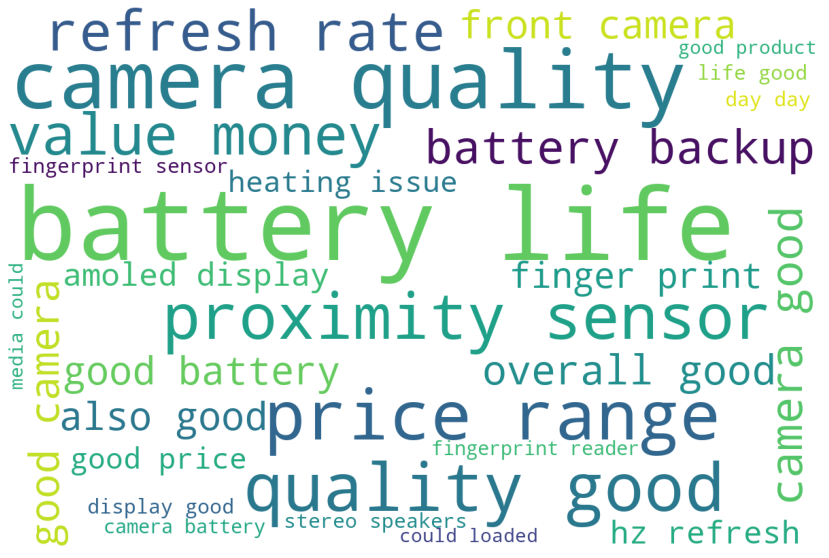

In [369]:
wc1 = WordCloud(width = 1200, height=800,max_words=200,background_color="white",stopwords=stopwords)
plt.figure(figsize=(15,10))
plt.imshow(wc1.generate_from_frequencies(word_freq_dict))
plt.axis("off")
plt.show()

In [370]:
tf1 = CountVectorizer(token_pattern="[a-z]+",max_df=0.80,min_df=5,stop_words=stopwords,ngram_range=(3,3))

In [371]:
tf_mat1 = tf1.fit_transform(df_amazon_new.Reviews)
tf_mat1

<564x10 sparse matrix of type '<class 'numpy.int64'>'
	with 80 stored elements in Compressed Sparse Row format>

In [372]:
tf1.vocabulary_

{'battery life good': 1,
 'good price range': 6,
 'good battery backup': 3,
 'hz refresh rate': 7,
 'battery backup good': 0,
 'camera quality good': 2,
 'good battery life': 4,
 'media could loaded': 8,
 'sound quality good': 9,
 'good camera quality': 5}

In [373]:
word_freq1= tf_mat1.sum(axis=0)[0]

In [374]:
word_freq1=np.array(word_freq1).reshape(tf_mat1.shape[1],)
word_freq1

array([ 6, 11, 13,  7,  6,  6,  6, 12, 10,  6])

In [375]:
word_freq_dict1={}
for k,v in tf1.vocabulary_.items():
    v = word_freq1[v]
    word_freq_dict1[k]=v

In [376]:
word_freq_dict1

{'battery life good': 11,
 'good price range': 6,
 'good battery backup': 7,
 'hz refresh rate': 12,
 'battery backup good': 6,
 'camera quality good': 13,
 'good battery life': 6,
 'media could loaded': 10,
 'sound quality good': 6,
 'good camera quality': 6}

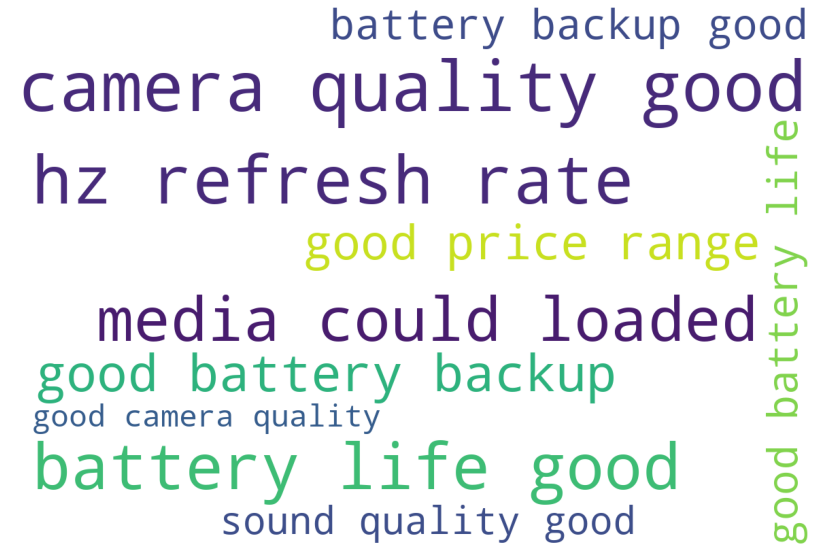

In [377]:
wc1 = WordCloud(width = 1200, height=800,max_words=200,background_color="white",stopwords=stopwords)
plt.figure(figsize=(15,10))
plt.imshow(wc1.generate_from_frequencies(word_freq_dict1))
plt.axis("off")
plt.show()

#**FLIPKART**

In [378]:
df_flipkart = pd.read_excel("/content/drive/MyDrive/flipkart_redmi_note_10_pro_20220920.xlsx")
df_flipkart.head()

,Dates,Reviews,Ratings
0,2022-08-22,Such a great phone in this price. In camera Su...,5
1,2021-08-15,I so happy ❤️😊❤️❤️ really amazing product in t...,5
2,2022-05-24,Best phone in the segment.Just keep in mind on...,5
3,2021-04-15,Pros : Build quality is good display quality I...,5
4,2022-05-24,It is very very nice and it's is Battery 🔋 per...,5


In [379]:
df_flipkart.shape

(890, 3)

In [380]:
df_flipkart.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 890 entries, 0 to 889
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Dates    877 non-null    datetime64[ns]
 1   Reviews  890 non-null    object        
 2   Ratings  890 non-null    int64         
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 21.0+ KB


In [381]:
df_flipkart.Dates.value_counts()

2022-06-23    113
2022-04-24     97
2022-07-23     95
2022-05-24     92
2022-08-22     86
2021-06-15     29
2021-08-15     20
2022-09-18     20
2022-08-31     19
2021-07-15     19
2021-04-15     18
2022-09-06     18
2021-05-15     17
2022-03-25     17
2022-09-04     16
2022-09-02     13
2022-09-05     12
2021-10-26     12
2022-09-01     12
2022-09-19     10
2022-09-16     10
2022-08-30      9
2022-09-08      9
2022-09-12      8
2022-09-03      8
2022-01-24      8
2021-11-25      8
2021-09-15      8
2022-09-15      8
2022-09-09      7
2022-02-23      7
2022-08-26      7
2022-09-07      7
2022-09-14      7
2022-09-17      6
2021-12-25      5
2022-09-21      5
2022-08-24      4
2022-09-10      2
2022-08-23      2
2022-08-29      2
2022-08-27      2
2022-09-11      1
2022-09-13      1
2022-08-25      1
Name: Dates, dtype: int64

In [382]:
df_flipkart["Ratings"].isnull().sum()

0

In [383]:
df_flipkart["Ratings"].value_counts()

5    477
4    176
1    125
3     76
2     36
Name: Ratings, dtype: int64

In [384]:
only_reviews1 = " ".join(df_flipkart.Reviews)

#removing punctuations

In [385]:
only_reviews1 = re.sub(r'[^\w\s]','',only_reviews1)

In [386]:
only_reviews1

'Such a great phone in this price In camera Super micro mode is just awesome Battery is also very good One of the best midrange phone I m not faced any issue in this phone till the date Here is some picture of super micro mode I so happy  really amazing product in this price camera quality so beautiful and nice Best phone in the segmentJust keep in mind one thing do not ever update update your phone Keep it in the software that it came with Do not apply any update The phone will work buttery smoothNo proximity sensor issue till now Great performance Great camera Great speakers Stereo speakers and dolby atmos works great Display is Just go for it guys  Pros  Build quality is good display quality Is good Camera is good Battery good as per your usageSound quality good dont expect to be too loud as you expect it is having speaker both top and bottomFace unlock is pretty good Call quality is good IR blaster working fine Cons  Heating issue they need to fix it heats a  lost especially when y

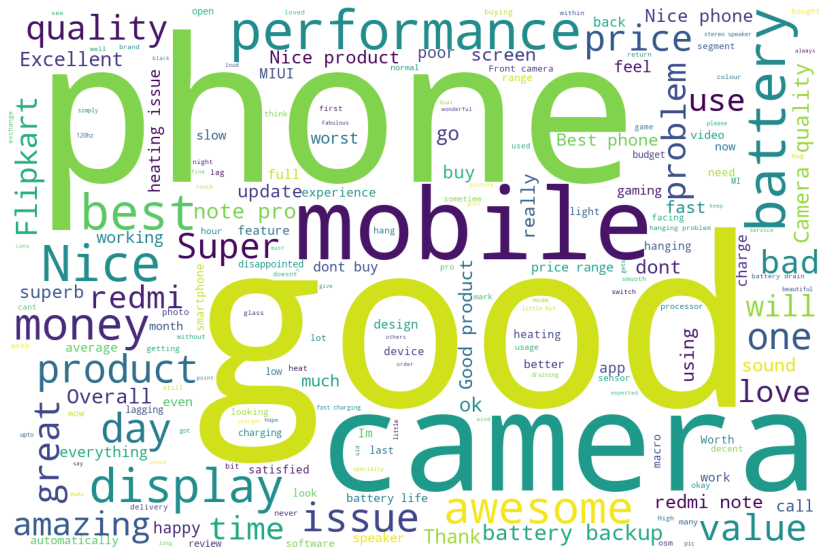

In [387]:
wc1 = WordCloud(width = 1200, height=800,max_words=200,background_color="white",stopwords=STOPWORDS)
plt.figure(figsize=(15,10))
plt.imshow(wc1.generate_from_text(only_reviews1))
plt.axis("off")
plt.show()

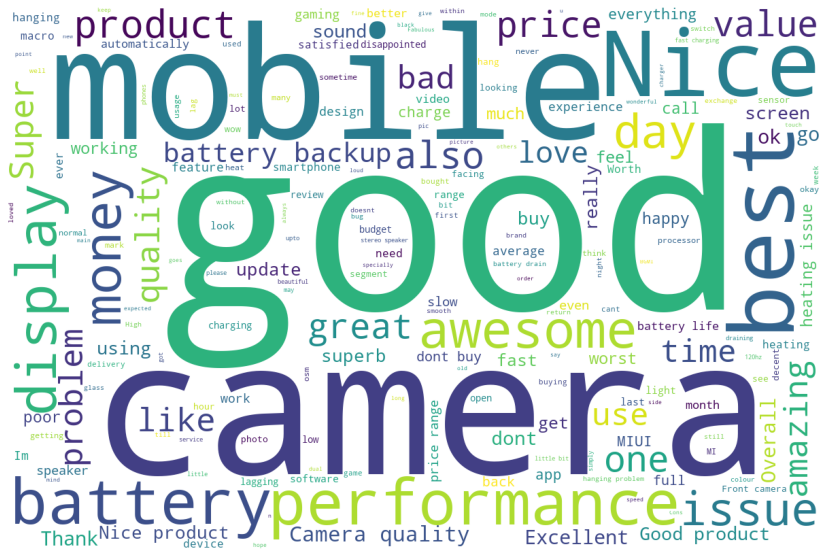

In [388]:
wc1 = WordCloud(width = 1200, height=800,max_words=200,background_color="white",stopwords=stopwords)
plt.figure(figsize=(15,10))
plt.imshow(wc1.generate_from_text(only_reviews1))
plt.axis("off")
plt.show()

In [389]:
tf_f = CountVectorizer(token_pattern="[a-z]+",max_df=0.80,min_df=5,stop_words=stopwords,ngram_range=(2,2))

In [390]:
tf_mat_f = tf_f.fit_transform(df_flipkart.Reviews)
tf_mat_f

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['amazon', 'flipkart'] not in stop_words.
  % sorted(inconsistent)


<890x91 sparse matrix of type '<class 'numpy.int64'>'
	with 846 stored elements in Compressed Sparse Row format>

In [391]:
tf_f.vocabulary_

{'awesome battery': 4,
 'battery also': 8,
 'also good': 0,
 'good one': 47,
 'one best': 67,
 'amazing product': 2,
 'camera quality': 29,
 'proximity sensor': 75,
 'great camera': 52,
 'stereo speakers': 80,
 'dolby atmos': 34,
 'build quality': 19,
 'quality good': 76,
 'good display': 43,
 'display quality': 33,
 'good camera': 42,
 'camera good': 27,
 'good battery': 41,
 'battery good': 13,
 'heating issue': 54,
 'back camera': 6,
 'finger print': 38,
 'nice battery': 62,
 'battery performance': 15,
 'performance good': 71,
 'camera also': 21,
 'display good': 32,
 'mobile price': 60,
 'excellent camera': 36,
 'thank flipkart': 82,
 'camera awesome': 23,
 'macro camera': 58,
 'good price': 49,
 'price range': 72,
 'best camera': 16,
 'battery backup': 9,
 'camera performance': 28,
 'fast charging': 37,
 'value money': 85,
 'nice camera': 63,
 'amoled display': 3,
 'front camera': 39,
 'glass back': 40,
 'really good': 77,
 'performance also': 69,
 'heating issues': 55,
 'upto mar

In [392]:
word_freq_f= tf_mat_f.sum(axis=0)[0]

In [393]:
word_freq_f.shape

(1, 91)

In [394]:
word_freq_f=np.array(word_freq_f).reshape(tf_mat_f.shape[1],)
word_freq_f

array([15,  6,  5,  5,  5,  8,  6,  8,  5, 31,  5,  8,  5,  9, 16, 11,  9,
        8,  8,  8,  7,  6,  5,  6, 13,  5,  8, 30,  8, 32,  6,  6, 11,  6,
        6,  5,  5,  7,  6, 12,  5,  9, 19, 11,  6,  5, 16,  6, 14,  9, 24,
        5,  5,  8, 16,  6,  6,  7,  5,  8,  6,  6,  5, 11,  7, 22,  5, 11,
       13,  6,  8, 20, 22,  5,  9,  5, 14,  8,  5,  6,  6,  6,  6,  7,  5,
       47,  5,  6,  5,  6,  8])

In [395]:
word_freq_dict_f={}
for k,v in tf_f.vocabulary_.items():
    v = word_freq_f[v]
    word_freq_dict_f[k]=v

In [396]:
word_freq_dict_f

{'awesome battery': 5,
 'battery also': 5,
 'also good': 15,
 'good one': 6,
 'one best': 11,
 'amazing product': 5,
 'camera quality': 32,
 'proximity sensor': 5,
 'great camera': 5,
 'stereo speakers': 6,
 'dolby atmos': 6,
 'build quality': 8,
 'quality good': 14,
 'good display': 11,
 'display quality': 6,
 'good camera': 19,
 'camera good': 30,
 'good battery': 9,
 'battery good': 9,
 'heating issue': 16,
 'back camera': 6,
 'finger print': 6,
 'nice battery': 5,
 'battery performance': 11,
 'performance good': 20,
 'camera also': 6,
 'display good': 11,
 'mobile price': 6,
 'excellent camera': 5,
 'thank flipkart': 6,
 'camera awesome': 6,
 'macro camera': 5,
 'good price': 9,
 'price range': 22,
 'best camera': 9,
 'battery backup': 31,
 'camera performance': 8,
 'fast charging': 7,
 'value money': 47,
 'nice camera': 11,
 'amoled display': 5,
 'front camera': 12,
 'glass back': 5,
 'really good': 8,
 'performance also': 6,
 'heating issues': 6,
 'upto mark': 5,
 'day day': 6,
 

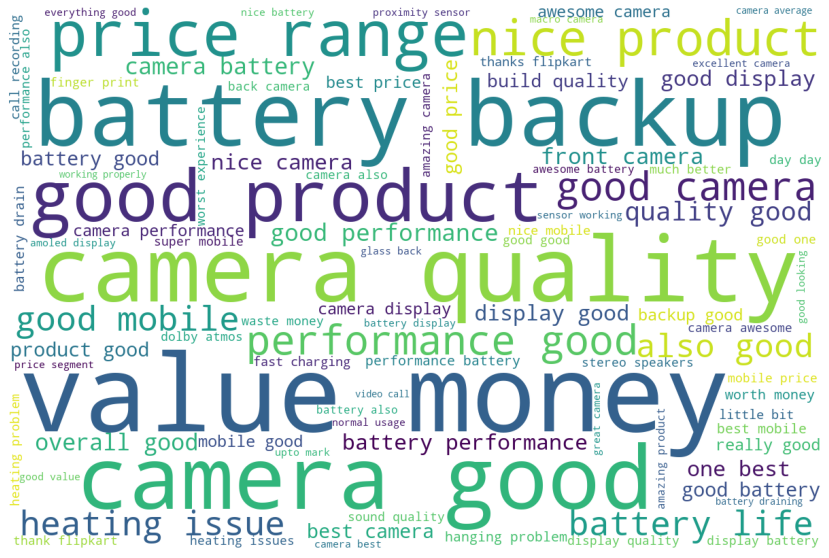

In [397]:
wc1 = WordCloud(width = 1200, height=800,max_words=200,background_color="white",stopwords=stopwords)
plt.figure(figsize=(15,10))
plt.imshow(wc1.generate_from_frequencies(word_freq_dict_f))
plt.axis("off")
plt.show()

In [398]:
tf_f1= CountVectorizer(token_pattern="[a-z]+",max_df=0.80,min_df=5,stop_words=stopwords,ngram_range=(3,3))

In [399]:
tf_mat_f1 = tf_f1.fit_transform(df_flipkart.Reviews)
tf_mat_f1

<890x5 sparse matrix of type '<class 'numpy.int64'>'
	with 27 stored elements in Compressed Sparse Row format>

In [400]:
tf_f1.vocabulary_

{'good price range': 3,
 'good battery backup': 2,
 'battery backup good': 0,
 'good value money': 4,
 'camera quality good': 1}

In [401]:
word_freq_f1= tf_mat_f1.sum(axis=0)[0]

In [402]:
word_freq_f1=np.array(word_freq_f1).reshape(tf_mat_f1.shape[1],)
word_freq_f1

array([6, 6, 5, 5, 5])

In [403]:
word_freq_dict_f1={}
for k,v in tf_f1.vocabulary_.items():
    v = word_freq_f1[v]
    word_freq_dict_f1[k]=v

In [404]:
word_freq_dict_f1

{'good price range': 5,
 'good battery backup': 5,
 'battery backup good': 6,
 'good value money': 5,
 'camera quality good': 6}

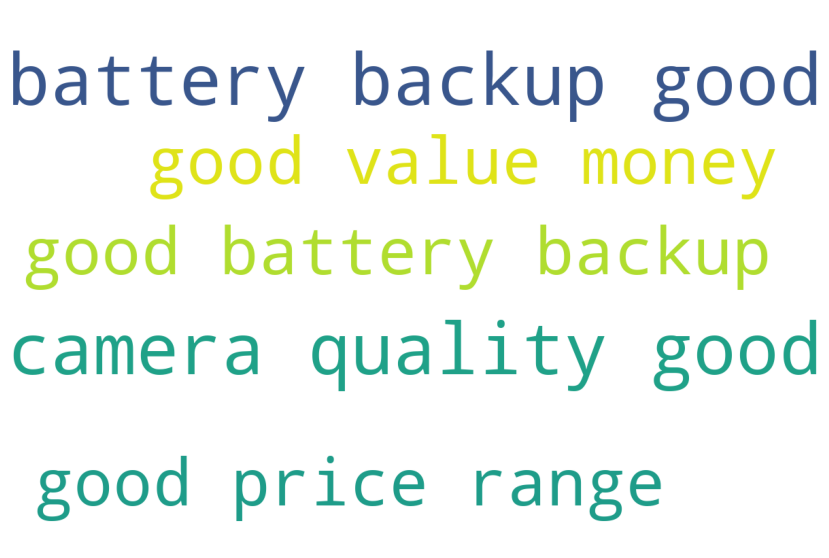

In [405]:
wc1 = WordCloud(width = 1200, height=800,max_words=200,background_color="white",stopwords=stopwords)
plt.figure(figsize=(15,10))
plt.imshow(wc1.generate_from_frequencies(word_freq_dict_f1))
plt.axis("off")
plt.show()

#Gensim Word2Vec

In [406]:
import gensim
from gensim.models import Word2Vec, KeyedVectors

# Process 1

In [407]:
from collections import defaultdict
import spacy
import gensim 
import os
import re
from nltk import sent_tokenize
from gensim.utils import simple_preprocess

In [408]:
only_reviews

'Since my OnePlus 7 conked off out of nowhere one fine day I was forced to scout for a new phone on a very short term basis Because of this I had to move from a phone in the budget premium segment to a higher trim phone within the midrange segment I will be writing this review from this perspective I have been using this phone as my main device since the 4th of July and Ive written this review after using this phone for a little under two weeksOne of the biggest things that got my eye was the beautiful Samsung AMOLED display It is on par with if not better than my older OnePlus 7 The blacks are beautiful and I could tell that MI did not skimp out on this segment However I do feel that their touch sensor could use some improvement as I find myself mistouching a lot of buttons on it Also the screen tends to have a significant flashing problem especially during the night While I dont think this is a very frequent issue do keep this in mind when making a purchase Another great thing about 

In [409]:
len(only_reviews)

132659

In [410]:
only_reviews[0]

'S'

In [411]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [412]:
corpus=df_amazon_new["Reviews"].tolist()
corpus[5]

"I bought the phone in drcmber of 2021 and till now it has beem having some bugs in the phone, whenever I receive a whatsApp call, the call dosent show up and to accept the call u will have to open the whatsApp to accept the call. Today, the screen suddenly went static and there was no response on the screen and i had to restart phone. The phone haven't even dropped a single time. This phone has broken my trust in redmi and would not recommend anyone else"

In [413]:
corpus[15]

'Good'

In [414]:
story=[]
for c in corpus:
  #print(c)
  raw_sent = sent_tokenize(c)
  for sent in raw_sent:
    story.append(simple_preprocess(sent))

In [415]:
story[0]

['since',
 'my',
 'oneplus',
 'conked',
 'off',
 'out',
 'of',
 'nowhere',
 'one',
 'fine',
 'day',
 'was',
 'forced',
 'to',
 'scout',
 'for',
 'new',
 'phone',
 'on',
 'very',
 'short',
 'term',
 'basis']

In [416]:
len(story)

1490

In [417]:
story[10]

['while',
 'hz',
 'does',
 'make',
 'noticeable',
 'difference',
 'to',
 'the',
 'speed',
 'at',
 'which',
 'images',
 'and',
 'frames',
 'move',
 'over',
 'time',
 'it',
 'didn',
 'feel',
 'too',
 'prominent']

In [418]:
model = gensim.models.Word2Vec(
    window=4,
    min_count=1
)

In [419]:
model.build_vocab(story)

In [420]:
model.corpus_count

1490

In [421]:
model.epochs

5

In [422]:
model.train(story, total_examples=model.corpus_count, epochs=model.epochs)

(85995, 115280)

In [423]:
model.wv.most_similar('battery')

[('and', 0.9999202489852905),
 ('it', 0.9999132752418518),
 ('was', 0.9999073147773743),
 ('on', 0.9999035596847534),
 ('which', 0.9999032616615295),
 ('the', 0.9999028444290161),
 ('to', 0.9999009370803833),
 ('or', 0.9998986124992371),
 ('some', 0.9998966455459595),
 ('for', 0.9998942613601685)]

In [424]:
model.wv.most_similar('camera')

[('of', 0.9999226331710815),
 ('and', 0.9999122619628906),
 ('the', 0.9999092221260071),
 ('but', 0.9999067783355713),
 ('that', 0.9999063611030579),
 ('was', 0.999902069568634),
 ('so', 0.9999017119407654),
 ('to', 0.9998971223831177),
 ('on', 0.9998947381973267),
 ('it', 0.9998925924301147)]

#Process 2

In [425]:
!pip install python-Levenshtein


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [426]:
review_text=df_amazon_new.Reviews.apply(gensim.utils.simple_preprocess)
review_text

0      [since, my, oneplus, conked, off, out, of, now...
1      [bought, this, smartphone, for, discount, of, ...
2      [got, this, phone, for, on, amazon, it, decent...
3      [the, phone, is, overall, quite, good, but, on...
4      [am, writing, this, review, after, one, week, ...
                             ...                        
585    [nice, sound, clarity, dual, stereo, speakers,...
586    [am, writing, review, after, monthsmobile, is,...
587    [the, overall, features, of, the, phone, is, n...
588                                      [good, product]
589    [value, for, money, sturdily, built, great, ca...
Name: Reviews, Length: 564, dtype: object

In [427]:
df_amazon_new.Reviews.iloc[0]

'Since my OnePlus 7 conked off out of nowhere one fine day, I was forced to scout for a new phone on a very short term basis. Because of this, I had to move from a phone in the budget premium segment to a higher trim phone within the midrange segment. I will be writing this review from this perspective. I have been using this phone as my main device since the 4th of July, and I\'ve written this review after using this phone for a little under two weeks.One of the biggest things that got my eye was the beautiful Samsung AMOLED display. It is on par with, if not better than my older OnePlus 7. The blacks are beautiful and I could tell that MI did not skimp out on this segment. However, I do feel that their touch sensor could use some improvement, as I find myself mistouching a lot of buttons on it. Also, the screen tends to have a significant flashing problem, especially during the night. While I don\'t think this is a very frequent issue, do keep this in mind when making a purchase. Ano

In [428]:
review_text.iloc[0]

['since',
 'my',
 'oneplus',
 'conked',
 'off',
 'out',
 'of',
 'nowhere',
 'one',
 'fine',
 'day',
 'was',
 'forced',
 'to',
 'scout',
 'for',
 'new',
 'phone',
 'on',
 'very',
 'short',
 'term',
 'basis',
 'because',
 'of',
 'this',
 'had',
 'to',
 'move',
 'from',
 'phone',
 'in',
 'the',
 'budget',
 'premium',
 'segment',
 'to',
 'higher',
 'trim',
 'phone',
 'within',
 'the',
 'midrange',
 'segment',
 'will',
 'be',
 'writing',
 'this',
 'review',
 'from',
 'this',
 'perspective',
 'have',
 'been',
 'using',
 'this',
 'phone',
 'as',
 'my',
 'main',
 'device',
 'since',
 'the',
 'th',
 'of',
 'july',
 'and',
 've',
 'written',
 'this',
 'review',
 'after',
 'using',
 'this',
 'phone',
 'for',
 'little',
 'under',
 'two',
 'weeks',
 'one',
 'of',
 'the',
 'biggest',
 'things',
 'that',
 'got',
 'my',
 'eye',
 'was',
 'the',
 'beautiful',
 'samsung',
 'amoled',
 'display',
 'it',
 'is',
 'on',
 'par',
 'with',
 'if',
 'not',
 'better',
 'than',
 'my',
 'older',
 'oneplus',
 'the',
 

In [429]:
model = gensim.models.Word2Vec(
        window = 10,
        min_count=3,
        workers = 4
)

In [430]:
model.build_vocab(review_text,progress_per=1000)

In [431]:
model.corpus_count

564

In [432]:
model.epochs

5

In [433]:
model.train(review_text,total_examples=model.corpus_count,epochs=1000)

(14526773, 23056000)

In [434]:
model.wv.most_similar("bad")

[('received', 0.30555981397628784),
 ('saw', 0.30470284819602966),
 ('same', 0.25715208053588867),
 ('youtube', 0.25651758909225464),
 ('till', 0.24811053276062012),
 ('rear', 0.24725425243377686),
 ('accurate', 0.24188610911369324),
 ('literally', 0.237787663936615),
 ('useless', 0.22938473522663116),
 ('may', 0.22511914372444153)]

In [435]:
model.wv.most_similar("good")

[('nice', 0.4922689199447632),
 ('is', 0.4628305435180664),
 ('awesome', 0.40030282735824585),
 ('great', 0.35845786333084106),
 ('camera', 0.3559267222881317),
 ('very', 0.32628560066223145),
 ('specially', 0.2811499536037445),
 ('poor', 0.26974421739578247),
 ('quality', 0.2693372368812561),
 ('average', 0.25669151544570923)]

In [436]:
model.wv.most_similar("camera")

[('good', 0.3559267222881317),
 ('very', 0.33170798420906067),
 ('is', 0.2978816032409668),
 ('clicks', 0.2908284664154053),
 ('glass', 0.2826727032661438),
 ('quick', 0.27812618017196655),
 ('view', 0.2657555639743805),
 ('yet', 0.2524731457233429),
 ('cam', 0.2514335513114929),
 ('specially', 0.25141286849975586)]

In [437]:
model.wv.most_similar("whatsapp")

[('part', 0.3023599684238434),
 ('does', 0.29837462306022644),
 ('voice', 0.28285786509513855),
 ('show', 0.27509409189224243),
 ('rest', 0.2677491009235382),
 ('mode', 0.2629464268684387),
 ('well', 0.25770968198776245),
 ('body', 0.25731006264686584),
 ('speaker', 0.2572937309741974),
 ('keeps', 0.2534657120704651)]

In [438]:
model.wv.most_similar("battery")

[('is', 0.3501793444156647),
 ('clearly', 0.233858123421669),
 ('annoying', 0.23279905319213867),
 ('and', 0.21471013128757477),
 ('quality', 0.2104824185371399),
 ('with', 0.20468685030937195),
 ('on', 0.20275898277759552),
 ('disappointed', 0.19996562600135803),
 ('pros', 0.19201186299324036),
 ('but', 0.18972858786582947)]

In [439]:
model.wv.most_similar("game")

[('bgmi', 0.4011242687702179),
 ('played', 0.3173946142196655),
 ('graphics', 0.29895952343940735),
 ('to', 0.2866517901420593),
 ('closing', 0.2766624093055725),
 ('heard', 0.2761889398097992),
 ('opening', 0.2755500078201294),
 ('pubg', 0.26764482259750366),
 ('twice', 0.2654443681240082),
 ('laggy', 0.2640998959541321)]

In [440]:
model.wv.most_similar("great")

[('good', 0.35845786333084106),
 ('is', 0.33722808957099915),
 ('rear', 0.315388560295105),
 ('an', 0.3063913583755493),
 ('fantastic', 0.2884175479412079),
 ('servicing', 0.256371408700943),
 ('weight', 0.2491471916437149),
 ('nice', 0.24167999625205994),
 ('excellent', 0.23610098659992218),
 ('means', 0.23228780925273895)]

In [441]:
model.wv.similarity(w1="cheap",w2="budget")

0.10803938

In [442]:
model.wv.similarity(w1="app",w2="whatsapp")

0.17154303

In [443]:
model.wv.similarity(w1="hour",w2="playing")

0.104633376

In [444]:
model.wv.similarity(w1="good",w2="high")

0.021358076

In [445]:
model.wv.similarity(w1="camera",w2="picture")

0.19587046

#Flipkart

In [446]:
review_text1=df_flipkart.Reviews.apply(gensim.utils.simple_preprocess)
review_text1

0      [such, great, phone, in, this, price, in, came...
1      [so, happy, really, amazing, product, in, this...
2      [best, phone, in, the, segment, just, keep, in...
3      [pros, build, quality, is, good, display, qual...
4      [it, is, very, very, nice, and, it, is, batter...
                             ...                        
885               [very, nice, phone, value, for, money]
886                                [very, nice, product]
887                                               [good]
888                                              [great]
889                [front, camera, quality, very, worst]
Name: Reviews, Length: 890, dtype: object

In [447]:
df_flipkart.Reviews.iloc[6]

'Awesome phone in this price. Display too much good to express. Camera is awesome to click. Performance uff best. Battery not so good to sustain. Overall awesome experienceLoved it😍😍😍'

In [448]:
review_text1.iloc[0]

['such',
 'great',
 'phone',
 'in',
 'this',
 'price',
 'in',
 'camera',
 'super',
 'micro',
 'mode',
 'is',
 'just',
 'awesome',
 'battery',
 'is',
 'also',
 'very',
 'good',
 'one',
 'of',
 'the',
 'best',
 'midrange',
 'phone',
 'not',
 'faced',
 'any',
 'issue',
 'in',
 'this',
 'phone',
 'till',
 'the',
 'date',
 'here',
 'is',
 'some',
 'picture',
 'of',
 'super',
 'micro',
 'mode']

In [449]:
model1 = gensim.models.Word2Vec(
        window = 10,
        min_count=3,
        workers = 4
)

In [450]:
model1.build_vocab(review_text1,progress_per=1000)

In [451]:
model1.corpus_count

890

In [452]:
model1.epochs

5

In [453]:
model1.train(review_text1,total_examples=model1.corpus_count,epochs=1000)

(6063108, 11187000)

In [454]:
model1.wv.most_similar("bad")

[('poor', 0.3237324357032776),
 ('good', 0.30630064010620117),
 ('my', 0.2711694836616516),
 ('very', 0.2652894854545593),
 ('much', 0.2571992874145508),
 ('is', 0.2545197606086731),
 ('support', 0.23589198291301727),
 ('worst', 0.23482197523117065),
 ('days', 0.22276084125041962),
 ('according', 0.2210082858800888)]

In [455]:
model1.wv.most_similar("good")

[('is', 0.45524853467941284),
 ('decent', 0.39559245109558105),
 ('awesome', 0.3683048486709595),
 ('nice', 0.36147958040237427),
 ('camera', 0.3418322503566742),
 ('and', 0.3142654299736023),
 ('superb', 0.3064182698726654),
 ('bad', 0.30630064010620117),
 ('so', 0.29771915078163147),
 ('average', 0.2966015338897705)]

In [456]:
model1.wv.most_similar("camera")

[('good', 0.3418322503566742),
 ('is', 0.3417450189590454),
 ('backup', 0.27652472257614136),
 ('quite', 0.2742314040660858),
 ('performance', 0.2668933868408203),
 ('and', 0.25507935881614685),
 ('high', 0.24734073877334595),
 ('very', 0.23515333235263824),
 ('build', 0.2349652796983719),
 ('glass', 0.22478815913200378)]

In [457]:
model.wv.most_similar("whatsapp")

[('part', 0.3023599684238434),
 ('does', 0.29837462306022644),
 ('voice', 0.28285786509513855),
 ('show', 0.27509409189224243),
 ('rest', 0.2677491009235382),
 ('mode', 0.2629464268684387),
 ('well', 0.25770968198776245),
 ('body', 0.25731006264686584),
 ('speaker', 0.2572937309741974),
 ('keeps', 0.2534657120704651)]

In [458]:
model1.wv.most_similar("battery")

[('is', 0.334014356136322),
 ('fast', 0.3283764123916626),
 ('half', 0.24870842695236206),
 ('night', 0.24579885601997375),
 ('good', 0.21228183805942535),
 ('for', 0.20976561307907104),
 ('give', 0.20125436782836914),
 ('have', 0.20000585913658142),
 ('day', 0.1986600011587143),
 ('it', 0.1941145807504654)]

In [459]:
model1.wv.most_similar("display")

[('back', 0.319588303565979),
 ('screen', 0.31506893038749695),
 ('range', 0.2982552647590637),
 ('amazing', 0.2477981448173523),
 ('is', 0.2354917675256729),
 ('must', 0.21434155106544495),
 ('loud', 0.20491507649421692),
 ('mode', 0.20227909088134766),
 ('two', 0.2019311487674713),
 ('osm', 0.19991883635520935)]

In [460]:
model1.wv.similarity(w1="money",w2="budget")

-0.044924334

In [461]:
model1.wv.similarity(w1="hour",w2="playing")

0.06202336

In [462]:
model1.wv.similarity(w1="camera",w2="picture")

0.041205995

In [463]:
model1.wv.similarity(w1="app",w2="processor")

-0.018741116

# models' accuracy in predictining rating in Amazon

In [464]:
data1 = pd.read_excel("/content/drive/MyDrive/amazon_redmi_note_10_pro_20220920.xlsx")
data1.head()

,Dates,Reviews,Ratings
0,2021-07-16,Since my OnePlus 7 conked off out of nowhere o...,5
1,2021-06-08,Bought this smartphone for a discount of 17500...,4
2,2022-09-11,"Got this phone for 15,499 on Amazon. It's a de...",4
3,2022-09-09,The phone is overall quite good but only one m...,4
4,2022-07-27,I am writing this review after one week of usa...,4


In [465]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 590 entries, 0 to 589
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Dates    590 non-null    datetime64[ns]
 1   Reviews  564 non-null    object        
 2   Ratings  590 non-null    int64         
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 14.0+ KB


In [466]:
data1.dropna(inplace=True)

In [467]:
data1.isnull().sum()

Dates      0
Reviews    0
Ratings    0
dtype: int64

In [468]:
data1.dropna()

,Dates,Reviews,Ratings
0,2021-07-16,Since my OnePlus 7 conked off out of nowhere o...,5
1,2021-06-08,Bought this smartphone for a discount of 17500...,4
2,2022-09-11,"Got this phone for 15,499 on Amazon. It's a de...",4
3,2022-09-09,The phone is overall quite good but only one m...,4
4,2022-07-27,I am writing this review after one week of usa...,4
...,...,...,...
585,2022-05-11,Nice sound clarity dual stereo speakers with D...,4
586,2022-07-15,I am writing review after 3 monthsMobile is aw...,5
587,2022-04-11,The overall features of the phone is norm.Cons...,3
588,2022-08-01,Good product .,5


In [469]:
from sklearn.decomposition import TruncatedSVD # it will not get the full matrix of left and right singular matrix
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import cohen_kappa_score, accuracy_score

In [470]:
x_train, x_val , y_train, y_val = train_test_split(data1.iloc[:,1],
                                                   data1.iloc[:,2],
                                                   test_size = 0.3,
                                                   random_state = 123456)

In [471]:
x_train.shape

(394,)

In [472]:
x_train

369                                I want one more free.
207    It's ok..not bad than the other phones on this...
549    Great phonePros - great amoled display with 12...
36                                       Best in segment
1      Bought this smartphone for a discount of 17500...
                             ...                        
580    I would like to review in one line. Awesome pr...
178                                Good product delivery
50     The Camera Quality is just soo bad ..but other...
519    For the price is overall a good phone.Camera q...
67                                                  Good
Name: Reviews, Length: 394, dtype: object

In [473]:
x_train.isnull().sum()

0

In [474]:
x_val.shape

(170,)

In [475]:
tfidf = TfidfVectorizer(stop_words=stopwords, 
                        token_pattern="[a-z']+",
                        max_df=0.90,
                        min_df=3)

In [476]:
tfidf_mat_train = tfidf.fit_transform(x_train)
tfidf_mat_val = tfidf.transform(x_val)

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['amazon', 'flipkart'] not in stop_words.
  % sorted(inconsistent)


In [477]:
tfidf_mat_train.shape

(394, 659)

In [478]:
tfidf_mat_val.shape

(170, 659)

In [479]:
lr_model_1 = LogisticRegression() #assumption in high dimension, classes are linearly separable
lr_model_1.fit(X=tfidf_mat_train,y=y_train)

LogisticRegression()

In [480]:
pred_val_lr = lr_model_1.predict(tfidf_mat_val)

print(cohen_kappa_score(pred_val_lr,y_val))
print(accuracy_score(pred_val_lr,y_val))

0.016371885068051872
0.4823529411764706


In [481]:
N=150
svd = TruncatedSVD(n_components=N) #150 is less than 280
svd_mat_train = svd.fit_transform(tfidf_mat_train)
svd_mat_val = svd.transform(tfidf_mat_val)

In [482]:
lr_model_2 = LogisticRegression()
lr_model_2.fit(X=svd_mat_train,y = y_train)
pred_val_lr2 = lr_model_2.predict(svd_mat_val)

print(cohen_kappa_score(pred_val_lr2,y_val))
print(accuracy_score(pred_val_lr2,y_val))

0.04017857142857151
0.49411764705882355


In [483]:
gbm = GradientBoostingClassifier(learning_rate=0.01,n_estimators=2000,max_depth =1)

In [484]:
gbm.fit(X=svd_mat_train,y = y_train)
pred_val_gbm = gbm.predict(svd_mat_val)

print(cohen_kappa_score(pred_val_gbm,y_val))
print(accuracy_score(pred_val_gbm,y_val))

0.09289617486338797
0.5117647058823529


In [485]:
svd_new = TruncatedSVD(n_components=150)

In [486]:
word_vec = svd_new.fit_transform(tfidf_mat_train.T)

In [487]:
word_vec.shape

(659, 150)

In [488]:
word_vec[0]

array([ 0.00478668,  0.00971699, -0.01194026, -0.00918732,  0.00018379,
        0.00868882, -0.01716283, -0.0031757 ,  0.00090919, -0.00538049,
        0.00018221,  0.00557757, -0.01230134,  0.00341151, -0.01590561,
       -0.00522964,  0.01707629, -0.00278159,  0.00643984, -0.0012468 ,
        0.01912262, -0.02332105, -0.01087459, -0.01262277,  0.01214304,
       -0.02489989, -0.00206813,  0.02306932,  0.01413661, -0.00414651,
       -0.05888351, -0.00385015,  0.01757894,  0.07137279,  0.06563517,
        0.02989074,  0.02609854,  0.01137192,  0.04142319,  0.04393967,
        0.0146757 ,  0.01639517, -0.10238786, -0.04591325,  0.05809441,
        0.05392289,  0.07010335, -0.01845941,  0.05960896,  0.07604388,
        0.07840379,  0.07213291,  0.00943315,  0.01359313, -0.01665535,
       -0.0391802 ,  0.01031974,  0.04888297,  0.00574639,  0.00631849,
       -0.06659078, -0.09320659, -0.00585315,  0.0656642 , -0.03847893,
        0.07943311,  0.01757162, -0.08637712,  0.00978692,  0.02

In [489]:
tfidf.vocabulary_["battery"] #giving the index

42

In [490]:
tfidf.vocabulary_["display"]

145

In [491]:
tfidf.vocabulary_

{'want': 621,
 'one': 388,
 'free': 207,
 'ok': 384,
 'bad': 38,
 'phones': 414,
 'budget': 63,
 'great': 237,
 'amoled': 15,
 'display': 145,
 'hz': 261,
 'battery': 42,
 'life': 295,
 'impressive': 268,
 'camera': 76,
 'setup': 522,
 'amazing': 13,
 'especially': 163,
 'macro': 317,
 'g': 212,
 'processor': 441,
 'cons': 117,
 'biggest': 51,
 'sometimes': 544,
 'fingerprint': 196,
 'sensor': 514,
 'due': 154,
 'best': 46,
 'segment': 512,
 'bought': 58,
 'smartphone': 536,
 'gb': 217,
 'glacial': 226,
 'blue': 57,
 'version': 614,
 'quite': 458,
 'buying': 71,
 'looking': 307,
 'reviews': 490,
 'amazon': 14,
 'must': 359,
 'say': 502,
 "i'm": 262,
 'happy': 245,
 'previous': 434,
 'although': 11,
 'pros': 446,
 'mostly': 352,
 'made': 318,
 'since': 530,
 'got': 235,
 'watching': 626,
 'hdr': 248,
 'wanted': 622,
 'color': 102,
 'blacks': 55,
 'reason': 468,
 'buy': 70,
 'terms': 571,
 'rounder': 494,
 'looks': 308,
 'even': 165,
 'hand': 241,
 'people': 406,
 'notice': 376,
 'matte'

In [492]:
from sklearn.metrics import pairwise_distances

In [493]:
dist_display = pairwise_distances(X=word_vec,
                               Y = word_vec[42,:].reshape(1,-1),
                               metric ="cosine")

In [494]:
dist_display

array([[0.99586547],
       [0.94762336],
       [0.93833896],
       [0.86443051],
       [0.92208207],
       [0.97080936],
       [0.87194428],
       [0.86415318],
       [0.99873454],
       [0.81201469],
       [0.88541993],
       [0.90378439],
       [0.93186528],
       [0.95369182],
       [0.98055491],
       [0.86565575],
       [0.98844058],
       [0.94524812],
       [0.97294672],
       [0.95834124],
       [0.88793583],
       [0.94575705],
       [0.97711299],
       [0.88482074],
       [0.9629906 ],
       [0.89405751],
       [0.96504475],
       [0.94348373],
       [0.84046853],
       [0.90094825],
       [0.95525252],
       [0.98379788],
       [0.89449511],
       [0.87000534],
       [0.95722822],
       [0.81058433],
       [0.88812414],
       [0.65341288],
       [0.95141049],
       [0.91170725],
       [0.82765592],
       [0.97684563],
       [0.        ],
       [0.97706724],
       [0.94465069],
       [0.98459515],
       [0.95661414],
       [0.974

In [495]:
dist_display.flatten().argsort()

array([ 42, 295,  76,  37, 286, 464, 145, 168, 196, 130,  91, 373, 184,
       214,  89, 293, 233, 556, 185,  87,  35,   9, 266, 245, 484,  88,
        40, 257, 287, 428, 319, 117, 103, 190, 312, 401, 344, 305, 328,
       537, 208, 599, 626, 427,  28, 431, 546, 593,  66, 446, 533, 409,
       571, 449, 258, 131, 625, 288, 105, 246, 419, 357,  52, 466, 604,
       465, 252, 268, 424, 496, 425, 423, 550, 388, 291, 379, 539,  71,
       548, 241, 458, 457, 193, 583, 140, 261, 109, 195, 132, 128, 615,
       438, 177,   7, 178,   3,  15, 192,  48, 650, 490, 645, 540, 150,
       515,  33, 259, 638, 405,   6, 451, 155, 275, 330, 636, 222, 282,
       591, 524, 411, 393, 530, 308, 552, 201, 627, 422, 242, 610, 342,
        61, 354, 463, 508,  95,  23, 380,  10, 396,  78, 276, 217,  90,
       164, 491, 448, 426,  20,  36, 657, 200, 237, 619, 250, 263, 455,
       191,  51, 297, 300, 335, 612, 198, 124, 238,  49, 331, 545,  25,
       444,  32, 236, 362, 324, 581, 588, 542, 158, 402, 188, 60

In [496]:
id_to_word = { v:k for k,v in tfidf.vocabulary_.items()}

In [497]:
id_to_word

{621: 'want',
 388: 'one',
 207: 'free',
 384: 'ok',
 38: 'bad',
 414: 'phones',
 63: 'budget',
 237: 'great',
 15: 'amoled',
 145: 'display',
 261: 'hz',
 42: 'battery',
 295: 'life',
 268: 'impressive',
 76: 'camera',
 522: 'setup',
 13: 'amazing',
 163: 'especially',
 317: 'macro',
 212: 'g',
 441: 'processor',
 117: 'cons',
 51: 'biggest',
 544: 'sometimes',
 196: 'fingerprint',
 514: 'sensor',
 154: 'due',
 46: 'best',
 512: 'segment',
 58: 'bought',
 536: 'smartphone',
 217: 'gb',
 226: 'glacial',
 57: 'blue',
 614: 'version',
 458: 'quite',
 71: 'buying',
 307: 'looking',
 490: 'reviews',
 14: 'amazon',
 359: 'must',
 502: 'say',
 262: "i'm",
 245: 'happy',
 434: 'previous',
 11: 'although',
 446: 'pros',
 352: 'mostly',
 318: 'made',
 530: 'since',
 235: 'got',
 626: 'watching',
 248: 'hdr',
 622: 'wanted',
 102: 'color',
 55: 'blacks',
 468: 'reason',
 70: 'buy',
 571: 'terms',
 494: 'rounder',
 308: 'looks',
 165: 'even',
 241: 'hand',
 406: 'people',
 376: 'notice',
 329: 'm

In [498]:
id_to_word[295]

'life'

In [499]:
id_to_word[76]

'camera'

In [500]:
id_to_word[26]

'april'

#LSA for amazon

In [501]:
tfidf1 = TfidfVectorizer(stop_words=stopwords, 
                        token_pattern="[a-z']+",
                        max_df=0.80,
                        min_df=3,
                        ngram_range=(1,4))

In [502]:
X=tfidf1.fit_transform(data1["Reviews"])

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['amazon', 'flipkart'] not in stop_words.
  % sorted(inconsistent)


In [503]:
data1.head()

,Dates,Reviews,Ratings
0,2021-07-16,Since my OnePlus 7 conked off out of nowhere o...,5
1,2021-06-08,Bought this smartphone for a discount of 17500...,4
2,2022-09-11,"Got this phone for 15,499 on Amazon. It's a de...",4
3,2022-09-09,The phone is overall quite good but only one m...,4
4,2022-07-27,I am writing this review after one week of usa...,4


In [504]:
X[0]

<1x1067 sparse matrix of type '<class 'numpy.float64'>'
	with 309 stored elements in Compressed Sparse Row format>

In [505]:
print(X[0])

  (0, 338)	0.028683950079161892
  (0, 77)	0.03517881108489965
  (0, 512)	0.03517881108489965
  (0, 142)	0.03385961379841241
  (0, 730)	0.04917229805066181
  (0, 1048)	0.03385961379841241
  (0, 619)	0.031081010031068657
  (0, 714)	0.06374086246895272
  (0, 559)	0.03517881108489965
  (0, 173)	0.031081010031068657
  (0, 987)	0.03517881108489965
  (0, 357)	0.03278175113299288
  (0, 70)	0.057507452055038065
  (0, 1033)	0.03278175113299288
  (0, 148)	0.03278175113299288
  (0, 135)	0.03517881108489965
  (0, 141)	0.03517881108489965
  (0, 216)	0.03385961379841241
  (0, 1004)	0.03385961379841241
  (0, 445)	0.06556350226598576
  (0, 834)	0.03517881108489965
  (0, 221)	0.09115407354325834
  (0, 889)	0.03187043123447636
  (0, 382)	0.030384691181086117
  (0, 409)	0.027772630180645373
  :	:
  (0, 96)	0.03385961379841241
  (0, 1022)	0.03385961379841241
  (0, 974)	0.03278175113299288
  (0, 536)	0.025664011690750436
  (0, 477)	0.031081010031068657
  (0, 946)	0.03278175113299288
  (0, 243)	0.14333898105

In [506]:
print(X[1])

  (0, 462)	0.039691064927416794
  (0, 228)	0.039691064927416794
  (0, 548)	0.03506765433816417
  (0, 1045)	0.039691064927416794
  (0, 686)	0.03820265916453664
  (0, 753)	0.02832010273826639
  (0, 314)	0.039691064927416794
  (0, 1011)	0.039691064927416794
  (0, 837)	0.0369865431072669
  (0, 461)	0.039691064927416794
  (0, 542)	0.0369865431072669
  (0, 327)	0.03820265916453664
  (0, 369)	0.0739730862145338
  (0, 772)	0.039691064927416794
  (0, 229)	0.039691064927416794
  (0, 227)	0.03294351332751901
  (0, 450)	0.03820265916453664
  (0, 729)	0.039691064927416794
  (0, 1047)	0.039691064927416794
  (0, 718)	0.03820265916453664
  (0, 851)	0.03595833163149044
  (0, 321)	0.039691064927416794
  (0, 836)	0.039691064927416794
  (0, 428)	0.03820265916453664
  (0, 283)	0.039691064927416794
  :	:
  (0, 469)	0.09667089374119667
  (0, 420)	0.1216621369838938
  (0, 495)	0.04709358869146322
  (0, 833)	0.09191510862823533
  (0, 12)	0.0662642995911977
  (0, 550)	0.02832010273826639
  (0, 986)	0.0454238694

In [507]:
X.shape

(564, 1067)

In [508]:
lsa = TruncatedSVD(n_components=10,n_iter=500)

In [509]:
lsa.fit(X)

TruncatedSVD(n_components=10, n_iter=500)

In [510]:
lsa.components_[0]

array([0.00124469, 0.00164863, 0.00047686, ..., 0.00169007, 0.00253248,
       0.0042515 ])

In [511]:
len(lsa.components_[0])

1067

In [512]:
terms = tfidf1.get_feature_names()
for i , comp in enumerate(lsa.components_):
  termsInComp = zip(terms,comp)
  sortedTerms = sorted(termsInComp,key = lambda x : x[1], reverse = True)[:15]
  print(f"Concept {i}")
  for term in sortedTerms:
    print(term[0])
  print("==================================================================================================")

Concept 0
good
camera
battery
quality
quality good
best
price
overall
camera quality
product
life
display
mobile
overall good
also
Concept 1
nice
camera
product
best
battery
quality
nice product
display
mobile
performance
one
like
life
camera quality
price
Concept 2
nice
good
nice product
quality nice
products
recommend
services
complete
department
hang
based
product good
good mobile
perfect
dual stereo speakers
Concept 3
best
budget
k
segment
best price
best budget
smartphone
mobile
price
nice
one best
good
product
rounder
next
Concept 4
value money
value
money
product
best
money product
value money product
still value
still value money
purchased
recommend
g
still
nice product
lagging
Concept 5
product
nice product
good product
excellent
amazon
like
product good
problem
awesome
service
satisfied
awesome product
much
price
money product
Concept 6
quality
camera quality
product
camera
quality good
camera quality good
life
battery life
nice product
average
reader
life good
fingerprint
ba

#models' accuracy in predictining rating in Flipkart

In [513]:
from sklearn.decomposition import TruncatedSVD # it will not get the full matrix of left and right singular matrix
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import cohen_kappa_score, accuracy_score

In [514]:
data = pd.read_excel("/content/drive/MyDrive/flipkart_redmi_note_10_pro_20220920.xlsx")
data.head()

,Dates,Reviews,Ratings
0,2022-08-22,Such a great phone in this price. In camera Su...,5
1,2021-08-15,I so happy ❤️😊❤️❤️ really amazing product in t...,5
2,2022-05-24,Best phone in the segment.Just keep in mind on...,5
3,2021-04-15,Pros : Build quality is good display quality I...,5
4,2022-05-24,It is very very nice and it's is Battery 🔋 per...,5


In [515]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 890 entries, 0 to 889
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Dates    877 non-null    datetime64[ns]
 1   Reviews  890 non-null    object        
 2   Ratings  890 non-null    int64         
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 21.0+ KB


In [516]:
x_train, x_val , y_train, y_val = train_test_split(data.iloc[:,1],
                                                   data.iloc[:,2],
                                                   test_size = 0.3,
                                                   random_state = 123456)

In [517]:
x_train.shape

(623,)

In [518]:
x_train

712                                   Good cemra quality
81                                             Beautiful
246    best phone under 20k!!!!i am actually suprised...
386    This is my 4th recommendation to my frnds,Boug...
834    Redmi note 10 pro very impressive smartphone. ...
                             ...                        
568                                  Camera is very nice
49     Good phone in this range. You get get best fea...
498                                               Nice 👍
746                         Super Mobile for this budget
65     So got damn good phone,go for it, after using ...
Name: Reviews, Length: 623, dtype: object

In [519]:
x_val.shape

(267,)

In [520]:
from wordcloud import STOPWORDS

In [521]:
tfidf = TfidfVectorizer(stop_words=stopwords, 
                        token_pattern="[a-z']+",
                        max_df=0.90,
                        min_df=3)

In [522]:
tfidf_mat_train = tfidf.fit_transform(x_train)
tfidf_mat_val = tfidf.transform(x_val)

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['amazon', 'flipkart'] not in stop_words.
  % sorted(inconsistent)


In [523]:
tfidf_mat_train.shape

(623, 283)

In [524]:
tfidf_mat_val.shape

(267, 283)

In [525]:
lr_model_1 = LogisticRegression() #assumption in high dimension, classes are linearly separable
lr_model_1.fit(X=tfidf_mat_train,y=y_train)

LogisticRegression()

In [526]:
pred_val_lr = lr_model_1.predict(tfidf_mat_val)

print(cohen_kappa_score(pred_val_lr,y_val)) #because of sparsity, in higher dim it couldnot do the justice
print(accuracy_score(pred_val_lr,y_val))

0.24965936187123883
0.6292134831460674


In [527]:
N=150
svd = TruncatedSVD(n_components=N) #150 is less than 280
svd_mat_train = svd.fit_transform(tfidf_mat_train)
svd_mat_val = svd.transform(tfidf_mat_val)

In [528]:
lr_model_2 = LogisticRegression()
lr_model_2.fit(X=svd_mat_train,y = y_train)
pred_val_lr2 = lr_model_2.predict(svd_mat_val)

print(cohen_kappa_score(pred_val_lr2,y_val))
print(accuracy_score(pred_val_lr2,y_val))

0.2543402527855353
0.6367041198501873


In [529]:
gbm = GradientBoostingClassifier(learning_rate=0.01,n_estimators=2000,max_depth =1)

In [530]:
gbm.fit(X=svd_mat_train,y = y_train)
pred_val_gbm = gbm.predict(svd_mat_val)

print(cohen_kappa_score(pred_val_gbm,y_val))
print(accuracy_score(pred_val_gbm,y_val))

0.19431833627837436
0.5842696629213483


In [531]:
svd_new = TruncatedSVD(n_components=150)

In [532]:
word_vec = svd_new.fit_transform(tfidf_mat_train.T)

In [533]:
word_vec.shape

(283, 150)

In [534]:
tfidf.vocabulary_["battery"] #giving the index

15

In [535]:
tfidf.vocabulary_["display"]

54

In [536]:
from sklearn.metrics import pairwise_distances

In [537]:
dist_display = pairwise_distances(X=word_vec,
                               Y = word_vec[52,:].reshape(1,-1),
                               metric ="cosine")

In [538]:
dist_display

array([[9.89704051e-01],
       [9.62664136e-01],
       [1.00655527e+00],
       [8.69681484e-01],
       [9.36611032e-01],
       [1.00573333e+00],
       [9.98060490e-01],
       [1.00100420e+00],
       [1.00382078e+00],
       [9.98122828e-01],
       [1.00298218e+00],
       [9.93006764e-01],
       [9.99477067e-01],
       [9.99777814e-01],
       [1.00002662e+00],
       [9.81953870e-01],
       [1.00012320e+00],
       [9.46841783e-01],
       [1.00041377e+00],
       [1.00902636e+00],
       [1.00217264e+00],
       [9.98902360e-01],
       [1.00554058e+00],
       [1.00722077e+00],
       [1.00049374e+00],
       [9.98852206e-01],
       [9.99063031e-01],
       [1.00440759e+00],
       [1.00163032e+00],
       [9.99812713e-01],
       [8.57241872e-01],
       [9.92628446e-01],
       [9.98391318e-01],
       [9.91777898e-01],
       [9.55416192e-01],
       [1.00294436e+00],
       [1.00253404e+00],
       [1.00477384e+00],
       [9.96276053e-01],
       [9.97673837e-01],


In [539]:
dist_display.flatten().argsort()

array([ 52,  88, 266, 176, 168,  85, 210,  92, 117,  30,  47,   3, 267,
       185, 104, 157, 215, 111, 251, 184, 265, 222, 137, 148, 271,   4,
        60, 260,  89,  17, 100, 152,  34, 120,   1, 155, 246,  81,  61,
       135,  51, 218,  54, 188, 116,  15, 166, 269, 277, 128, 278, 175,
       281,  95, 171, 199,   0, 138, 197, 249, 241,  33,  70, 158,  45,
       225,  31, 203, 245,  11, 274, 219, 242, 110, 231, 123, 243,  43,
        62, 147,  67,  57,  73, 130, 250,  44, 192, 102,  65,  93, 177,
        79, 205,  38, 122, 167,  78, 258,  96, 272, 140, 141, 151,  39,
       204, 208, 156,   6,  74,   9,  49, 145,  32, 270,  41, 109, 220,
       154, 125, 181,  25, 209,  21, 195,  26, 107, 216,  83,  53, 211,
        63, 139, 230,  56, 217, 101, 279,  80, 202, 268,  82,  12, 134,
       189, 224, 232, 165,  68, 178,  97, 240, 213,  13,  29,  64, 227,
       163, 132, 239, 159, 108, 143,  14,  84, 169,  16, 124, 146,  69,
       273, 226, 275, 261, 201,  18, 161, 164,  48,  98,  24, 18

In [540]:
id_to_word = { v:k for k,v in tfidf.vocabulary_.items()}

In [541]:
id_to_word

{93: 'good',
 199: 'quality',
 16: 'beautiful',
 17: 'best',
 116: 'k',
 175: 'performance',
 33: 'camera',
 54: 'display',
 92: 'go',
 189: 'problem',
 84: 'g',
 95: 'great',
 244: 'th',
 23: 'bought',
 261: 'use',
 120: 'last',
 282: 'year',
 81: 'flipkart',
 188: 'price',
 141: 'mi',
 227: 'smartphone',
 15: 'battery',
 181: 'photo',
 145: 'miui',
 3: 'amazing',
 192: 'product',
 201: 'range',
 224: 'simply',
 174: 'perfect',
 64: 'excellent',
 146: 'mobile',
 265: 'value',
 148: 'money',
 221: 'series',
 231: 'sometimes',
 13: 'backup',
 66: 'exchange',
 74: 'fast',
 50: 'delivery',
 248: 'think',
 100: 'happy',
 24: 'brand',
 51: 'design',
 1: 'also',
 11: 'awesome',
 186: 'poor',
 103: 'heating',
 256: 'ui',
 18: 'better',
 118: 'lag',
 5: 'app',
 151: 'much',
 114: 'issue',
 8: 'auto',
 216: 'screen',
 194: 'properly',
 123: 'light',
 159: 'nice',
 37: 'charger',
 20: 'big',
 239: 'super',
 269: 'weeks',
 53: 'disappointed',
 38: 'charging',
 236: 'speed',
 36: 'charged',
 0: 'a

In [542]:
id_to_word[52]

'device'

In [543]:
id_to_word[14]

'bad'

In [544]:
id_to_word[32]

'calls'

In [545]:
id_to_word[169]

'osm'

#LSA for flipkart

In [546]:
len(stopwords)

186

In [547]:
tfidf1 = TfidfVectorizer(stop_words=stopwords, 
                        token_pattern="[a-z']+",
                        max_df=0.80,
                        min_df=3,
                        ngram_range=(1,4))

In [548]:
X=tfidf1.fit_transform(data["Reviews"])

/usr/local/lib/python3.7/dist-packages/sklearn/feature_extraction/text.py:401: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['amazon', 'flipkart'] not in stop_words.
  % sorted(inconsistent)


In [549]:
data.head()

,Dates,Reviews,Ratings
0,2022-08-22,Such a great phone in this price. In camera Su...,5
1,2021-08-15,I so happy ❤️😊❤️❤️ really amazing product in t...,5
2,2022-05-24,Best phone in the segment.Just keep in mind on...,5
3,2021-04-15,Pros : Build quality is good display quality I...,5
4,2022-05-24,It is very very nice and it's is Battery 🔋 per...,5


In [550]:
X[0]

<1x594 sparse matrix of type '<class 'numpy.float64'>'
	with 23 stored elements in Compressed Sparse Row format>

In [551]:
print(X[0])

  (0, 44)	0.22240336223664162
  (0, 379)	0.18728289928854241
  (0, 242)	0.20297478588952575
  (0, 5)	0.17427440230511437
  (0, 43)	0.20832654385731436
  (0, 28)	0.20832654385731436
  (0, 109)	0.21465633004680823
  (0, 416)	0.20832654385731436
  (0, 538)	0.1942497254779871
  (0, 286)	0.1383737333566265
  (0, 181)	0.21465633004680823
  (0, 57)	0.11030592533367102
  (0, 378)	0.14076900757867128
  (0, 225)	0.07216462698858017
  (0, 4)	0.139952082689711
  (0, 42)	0.09946937779188991
  (0, 27)	0.1240406945825696
  (0, 346)	0.4166530877146287
  (0, 330)	0.42931266009361646
  (0, 514)	0.2832112385750006
  (0, 93)	0.08391498723560542
  (0, 424)	0.1289695763610622
  (0, 253)	0.144243675659126


In [552]:
print(X[1])

  (0, 107)	0.30557837396079457
  (0, 12)	0.42380746580090023
  (0, 364)	0.20711796828851622
  (0, 56)	0.40348914501541394
  (0, 443)	0.2544496572051464
  (0, 431)	0.22725402396143
  (0, 8)	0.2898182599635114
  (0, 453)	0.3387736454908211
  (0, 263)	0.32890258208190076
  (0, 93)	0.17071179420801483
  (0, 424)	0.2623682431962854


In [553]:
X.shape

(890, 594)

In [554]:
lsa = TruncatedSVD(n_components=10,n_iter=500)
lsa.fit(X)

TruncatedSVD(n_components=10, n_iter=500)

In [555]:
lsa.components_[0]

array([2.35994960e-03, 7.97848156e-04, 6.75116450e-04, 2.95108622e-03,
       1.65446451e-02, 8.31860857e-03, 1.14324101e-03, 1.15755451e-03,
       1.46779482e-02, 9.21565616e-04, 3.89699315e-03, 3.07864728e-03,
       3.34608796e-03, 3.91795249e-03, 1.63305165e-03, 1.02395058e-03,
       1.43336323e-03, 3.99613046e-03, 7.35727801e-04, 1.50763765e-03,
       1.42727787e-03, 1.21663660e-04, 6.85480187e-04, 2.95777409e-03,
       1.39223274e-03, 4.79529056e-03, 6.85690164e-04, 3.10177241e-02,
       2.19507762e-03, 4.95434309e-03, 1.53934706e-03, 1.56642397e-03,
       2.99384697e-03, 1.62481848e-03, 2.11517135e-03, 7.97620345e-03,
       4.57073287e-03, 1.86204846e-02, 8.73046471e-03, 9.91249685e-03,
       1.31669580e-03, 3.61108078e-04, 3.70029534e-02, 2.29369831e-03,
       1.58667025e-03, 1.46828078e-02, 4.91113042e-03, 2.37729305e-03,
       1.56390228e-03, 1.14360971e-03, 8.43785229e-03, 5.33553687e-03,
       1.79516032e-03, 5.29570135e-04, 5.55910291e-03, 3.32765910e-03,
      

In [556]:
terms = tfidf1.get_feature_names()
for i , comp in enumerate(lsa.components_):
  termsInComp = zip(terms,comp)
  sortedTerms = sorted(termsInComp,key = lambda x : x[1], reverse = True)[:15]
  print(f"Concept {i}")
  for term in sortedTerms:
    print(term[0])
  print("==============================================================================================")

Concept 0
good
nice
product
good product
camera
mobile
good mobile
performance
battery
quality
camera good
money
awesome
good camera
best
Concept 1
nice
nice product
product
nice camera
camera
like
super
value money
mobile
value
nice mobile
money
camera nice
love
display
Concept 2
best
money
value money
value
camera
awesome
mobile
battery
product
super
performance
display
excellent
quality
price
Concept 3
product
good product
nice product
best
product good
flipkart
worst product
worst
amazing product
love
range
thanks flipkart
thanks
satisfied
amazing
Concept 4
money
value money
value
product
good product
nice product
excellent
good value
good value money
worth money
worth
waste
waste money
mobile value
mobile value money
Concept 5
awesome
super
product
camera
good product
battery
display
performance
nice product
awesome camera
bad
camera quality
love
everything
miui
Concept 6
super
mobile
good mobile
super mobile
camera
quality
superb
super camera
problem
battery
excellent
product
lik

# Spacy in Amazon

In [557]:
!python -m spacy download en_core_web_lg

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 587.7 MB 8.9 kB/s 
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')


In [558]:
only_reviews

'Since my OnePlus 7 conked off out of nowhere one fine day I was forced to scout for a new phone on a very short term basis Because of this I had to move from a phone in the budget premium segment to a higher trim phone within the midrange segment I will be writing this review from this perspective I have been using this phone as my main device since the 4th of July and Ive written this review after using this phone for a little under two weeksOne of the biggest things that got my eye was the beautiful Samsung AMOLED display It is on par with if not better than my older OnePlus 7 The blacks are beautiful and I could tell that MI did not skimp out on this segment However I do feel that their touch sensor could use some improvement as I find myself mistouching a lot of buttons on it Also the screen tends to have a significant flashing problem especially during the night While I dont think this is a very frequent issue do keep this in mind when making a purchase Another great thing about 

In [559]:
import spacy

In [560]:
nlp = spacy.load('en_core_web_lg')

In [561]:
texts = nlp(only_reviews)

In [562]:
for token in texts[:20]:
  print(token.text, token.pos_)

Since SCONJ
my PRON
OnePlus PROPN
7 NUM
conked VERB
off ADP
out ADP
of ADP
nowhere ADV
one NUM
fine ADJ
day NOUN
I PRON
was AUX
forced VERB
to PART
scout VERB
for ADP
a DET
new ADJ


In [563]:
list(texts.noun_chunks)[:20]

[my OnePlus,
 nowhere one fine day,
 I,
 a new phone,
 a very short term basis,
 this,
 I,
 a phone,
 the budget premium segment,
 a higher trim phone,
 the midrange segment,
 I,
 this review,
 this perspective,
 I,
 this phone,
 my main device,
 the 4th,
 July,
 I]

In [564]:
for chunk in texts.noun_chunks:
  if len(chunk)>7:
    print(chunk)

poor Camera quality  Super CoolBattery life  AverageCall record function
available display camera battery charging sensors glass protection
not impressive Average phone Very smooth functioningno heatingno lagginggood battery life
good Camera clarity osm  Super camera quality U
everything good camera  good display good batteryI
smartphone Bhai mst phone haiBattery ka locha hai aur aisa koi khas
Its sleek and sturdy Only the camera array
screen resolution display sound quality dislikes software lag
732 sd prosear 5020mah battery  very good product
JUST THE RIGHT PRICE THEN BUY ITTHERES A REASON THEYRE
Display PROBLEMSensors  Auto Rotation Brightness  Proximity sensors
a 12 MP 4 year old phone camera
very smoth and graphic sport 60fps bgmi graphics 90fps sport
a sure shot BEAST  Very good performance
really good and bright even mi optimized software
2022Camera next level Display amazing Performance best Best mob
the black white n neutral colour mindsetmi store
SBI Cr CardAwasome product S

In [565]:
list(texts.sents)

[Since my OnePlus 7 conked off out of nowhere one fine day I was forced to scout for a new phone on a very short term basis Because of this I had to move from a phone in the budget premium segment to a higher trim phone within the midrange segment I will be writing this review from this perspective I have been using this phone as my main device since the 4th of July and Ive written this review after using this phone for a little under two weeksOne of the biggest things that got my eye was the beautiful Samsung AMOLED display It is on par with if not better than my older OnePlus 7,
 The blacks are beautiful and I could tell that MI did not skimp out on this segment However I do feel that their touch sensor could use some improvement as I find myself mistouching a lot of buttons on it Also the screen tends to have a significant flashing problem especially during the night While I dont think this is a very frequent issue do keep this in mind when making a purchase Another great thing abou

In [566]:
for ent in texts.ents:
  print(ent.text)

OnePlus 7
the 4th of July
a little under two
Samsung
OnePlus 7
MI
120 Hz
sureThe
youtube
a few days
MI
Macro
64
8 hours
30100
Xiaomi
4
Xiaomis
Redmi
Battlegrounds India
around half an hour
AnTuTu
10
freezes4
17500
8128GB
Amazon
Realme 5 Pro
Netflix
192g
6040
5
5
5
first
5
basic day
8GB
first
miui
getapps
Verdict
2 weeks
miui
youtube
2160p youtube
83 hours
hours
week7 Phone
miui
second
4
15499
Amazon
64MP
all day
only one
one week
better than one
66inch
One
Glass
feel3Fingerprint
range5 Processor
5000mah
Battery
almost a day
120 hours
drcmber
2021
Today
Battery
6hrd
78hrs
miui 125
two
first
second
night
5
struggles3 Battery
first
almost 225 hours
1525
second
67 hours
almost 152 hours
available5 Performance  PRO  
9
4
The day to day
memory6 Software
MIUI
getapps
Darktheme
MOTO
customization7 Network
5
2 years
10
One
one year old
6
15 days
one
one day
33  watt
first
miui
disappointed2
manageableConclusionYou
11
4g
Redmi
9
42k
Redmi
9
Xiaomi
less than an hour
115 years
one year
Screen
Batt

In [567]:
for ent in texts.ents:
  print(ent.text,ent.label_)

OnePlus 7 PRODUCT
the 4th of July DATE
a little under two DATE
Samsung ORG
OnePlus 7 PRODUCT
MI GPE
120 Hz QUANTITY
sureThe PERSON
youtube ORG
a few days DATE
MI GPE
Macro ORG
64 CARDINAL
8 hours TIME
30100 CARDINAL
Xiaomi ORG
4 CARDINAL
Xiaomis ORG
Redmi PRODUCT
Battlegrounds India LOC
around half an hour TIME
AnTuTu CARDINAL
10 CARDINAL
freezes4 ORG
17500 CARDINAL
8128GB QUANTITY
Amazon ORG
Realme 5 Pro PRODUCT
Netflix ORG
192g QUANTITY
6040 CARDINAL
5 CARDINAL
5 CARDINAL
5 CARDINAL
first ORDINAL
5 CARDINAL
basic day DATE
8GB QUANTITY
first ORDINAL
miui PERSON
getapps PERSON
Verdict PERSON
2 weeks DATE
miui PERSON
youtube ORG
2160p youtube PRODUCT
83 hours TIME
hours TIME
week7 Phone ORG
miui PERSON
second ORDINAL
4 CARDINAL
15499 CARDINAL
Amazon ORG
64MP CARDINAL
all day DATE
only one CARDINAL
one week DATE
better than one CARDINAL
66inch CARDINAL
One CARDINAL
Glass PERSON
feel3Fingerprint PRODUCT
range5 Processor ORG
5000mah CARDINAL
Battery PRODUCT
almost a day DATE
120 hours TIME

In [568]:
for ent in texts.ents: #finding out different entities
  if ent.label_ =='PERSON':
    print(ent.text,ent.label_)

sureThe PERSON
miui PERSON
getapps PERSON
Verdict PERSON
miui PERSON
miui PERSON
Glass PERSON
drcmber PERSON
available5 Performance  PRO   PERSON
getapps PERSON
miui PERSON
max PERSON
miui PERSON
Mi PERSON
120hz PERSON
Bhai PERSON
haiBattery ka locha hai aur PERSON
bhi koi PERSON
nahi yaar mene PERSON
Android bhi PERSON
Kiya hai PERSON
ka PERSON
kabhi kabhi PERSON
mil raha hai PERSON
akh band PERSON
fotos Lowlight PERSON
Bloatware PERSON
Definetely PERSON
Jack PERSON
pro ke muquableCamera PERSON
ki jarurat hai PERSON
like1RAM PERSON
Dnt knw PERSON
responsiveBattery PERSON
itl PERSON
processorPhone PERSON
Miui PERSON
Mi PERSON
thanku Amazon PERSON
Processer PERSON
Max Pro PERSON
miui PERSON
Miui PERSON
goodSpecially PERSON
price1 PERSON
bugsAnd PERSON
gimmickAnd PERSON
note8 sd665Pros1 s Amoled PERSON
rate6 PERSON
Amoled aahhh PERSON
noticeable2UIMIUI PERSON
gcam PERSON
costYou PERSON
lagsCamera PERSON
brightnes PERSON
goodLight PERSON
call6 PERSON
Worthful PERSON
codehe PERSON
miui PER

In [569]:
for ent in texts.ents: #finding out different entities
  if ent.label_ =='PRODUCT':
    print(ent.text,ent.label_)

OnePlus 7 PRODUCT
OnePlus 7 PRODUCT
Redmi PRODUCT
Realme 5 Pro PRODUCT
2160p youtube PRODUCT
feel3Fingerprint PRODUCT
Battery PRODUCT
Battery PRODUCT
Battery PRODUCT
Battery PRODUCT
6128 PRODUCT
M21 PRODUCT
Batter PRODUCT
Pixel PRODUCT
OnePlus PRODUCT
Battery PRODUCT
hotstar PRODUCT
Battery PRODUCT
Battery PRODUCT
Battery PRODUCT
Battery PRODUCT
Battery PRODUCT
5gOverallYou PRODUCT
soc 695 PRODUCT
hassleIam PRODUCT
ProsCamara PRODUCT
Finger PRODUCT
Nyc PRODUCT
Xioami PRODUCT
Battery PRODUCT
DND PRODUCT
Battery PRODUCT
MX Player PRODUCT
MX PRODUCT
do11 PRODUCT
AnnoyingBattery PRODUCT
Battery PRODUCT
5RAM PRODUCT
Galaxy PRODUCT
Battery PRODUCT
Battery PRODUCT
microSD PRODUCT
GSM PRODUCT
X3 PRODUCT
Snapdragon 860 PRODUCT
Battery PRODUCT
RS 17999 Battery PRODUCT
60fps 1080 PRODUCT


In [570]:
for token in texts:
  if token.pos_ == 'NOUN':
    print(token)

Streaming output truncated to the last 5000 lines.
app
optimization
issue
meIm
device
works
ram
banger
ads
5stars
phone
price
rangeCamera
soso
camera
quality
life
Lasts
day
charge
processor
display
product
price
range
phone
issue
sd
card
data
device
data
methods
helpedand
thing
review
week
usage
Premium
look
colour
contrast
par
60hz
touch
quality
video
screen
size
video
lights
hell
viewing2Build
appearance
look
build
premium
gorilla
back
price
range
flagship
feel3Fingerprint
sensor
advantage
fingerprint
sensor
side
Camera
camera
price
range
mode
modes
flow
photos
price
mobiles
price
range
win6
games
lag
apps
videos
heating
issues
pro
battery
Discharges
Battery
day
day
users
users
annoying2
hours
charge
phones
categoryBottom
line
premium
experience
phone
bugs
phone
call
call
dosent
show
call
whatsApp
call
Today
screen
response
screen
phone
phone
time
phone
trust
Display
Battery
backup
usage
78hrs
usage
Performance
phone
Good
segment
battery
issues
update
review
unit
battery
life
touch
i

In [571]:
for token in texts:
  if token.orth_ == 'display':
    print(token.dep_)
    print([w for w in token.head.rights])

attr
[display]
ccomp
[display]
nsubj
[together, make]
pobj
[display]
dobj
[display]
nsubj
[]
nsubj
[also, look, and, feel]
compound
[]
conj
[plus, display]
dobj
[talk, firstscreen, display, and, believe]
compound
[]
compound
[]
compound
[on]
pobj
[display]
pobj
[display]
compound
[enjoy]
dobj
[display]
dobj
[display]
nsubjpass
[ofc, with, and, are]
dobj
[display]
compound
[and, storage, products]
dobj
[display, but]
pobj
[display]
dep
[not, lasting, display, experience]
pobj
[display]
attr
[really, display, and, with]
nmod
[]
ccomp
[not, simple, display]
nmod
[looking]
nsubj
[of]
pobj
[display]
ROOT
[and, camara, in, experience]
compound
[]
compound
[of, also, also, feature]
compound
[]
npadvmod
[for, camera]
dobj
[display]
nsubj
[you, experience, buy, is]
compound
[]
nsubj
[also, great, are]
pobj
[display]
pobj
[display]
attr
[display]
pobj
[display]
compound
[]
conj
[and, display]
compound
[]
pobj
[display]
dobj
[display]
nsubj
[is, is]
pobj
[display]
npadvmod
[cost, re, is, am, but,

In [572]:
for token in texts:
  if token.orth_ == 'display':
    print(token.dep_)
    print([w for w in token.head.rights if w.dep_ == "acomp"])

attr
[]
ccomp
[]
nsubj
[]
pobj
[]
dobj
[]
nsubj
[]
nsubj
[]
compound
[]
conj
[]
dobj
[]
compound
[]
compound
[]
compound
[]
pobj
[]
pobj
[]
compound
[]
dobj
[]
dobj
[]
nsubjpass
[]
dobj
[]
compound
[]
dobj
[]
pobj
[]
dep
[lasting]
pobj
[]
attr
[]
nmod
[]
ccomp
[simple]
nmod
[]
nsubj
[]
pobj
[]
ROOT
[]
compound
[]
compound
[]
compound
[]
npadvmod
[]
dobj
[]
nsubj
[]
compound
[]
nsubj
[great]
pobj
[]
pobj
[]
attr
[]
pobj
[]
compound
[]
conj
[]
compound
[]
pobj
[]
dobj
[]
nsubj
[]
pobj
[]
npadvmod
[]
nsubj
[]
pobj
[]
dobj
[]
ccomp
[]
dobj
[]
pobj
[]
dep
[]
compound
[]
pobj
[]
nsubj
[]
compound
[]
compound
[]
compound
[]
pobj
[]
nmod
[]
compound
[]
pobj
[]
compound
[]
nmod
[]
dep
[]
nsubj
[]
attr
[]
pobj
[]
nsubj
[nice]
nmod
[]
compound
[]
compound
[]
pobj
[]
pobj
[]
attr
[]
nsubj
[amazing]
dobj
[]
dobj
[]
nsubj
[]
dobj
[]
nsubj
[good]
pobj
[]
nsubj
[]


In [573]:
for token in texts:
  if token.dep_ in ['nsubj']:
    print("{}---{}".format(token.orth_,[w for w in token.head.rights]))

OnePlus---[off, out]
I---[move, writing, and, written, was]
I---[review, from, using]
I---[phone, as]
I---[review, after]
that---[eye]
It---[on]
blacks---[beautiful, and, tell]
I---[skimp, tends]
MI---[out, on, feel]
I---[use]
sensor---[improvement, find]
I---[mistouching]
myself---[lot, on]
screen---[have, think]
I---[is, keep]
this---[issue]
Hz---[difference, feel, have]
images---[over]
it---[prominent]
websites---[scrolling, making]
it---[alienating]
rate---[noticeable, sureThe]
quality---[good, have]
phone---[plastic, back, feel]
it---[cheap, and, feels]
sides---[it, look, recommend]
which---[highlight]
phone---[lot]
I---[treating, is, offers, made]
I---[amount]
I---[go, is, works, is, seems, think]
apps---[mode, turned]
which---[appear, are]
images---[incorrectly, on]
screen---[unresponsive, and, is]
software---[good, major, plus, is]
phone---[with, out, and, have]
phone---[issues]
time---[fact, is]
I---[]
issues---[running]
phone---[call, puts]
this---[phone, under]
I---[it, pass

In [574]:
for token in texts:
  if token.dep_=='nsubj':
    words=[w for w in token.head.rights]
    for wo in words:
      if wo.dep_ == 'acomp':
        print("{}---{}".format(token.orth_,[w for w in wo.subtree]))

blacks---[beautiful]
it---[too, prominent]
it---[a, bit, alienating]
rate---[very, noticeable, for]
quality---[quite, good, for, the, price]
it---[cheap]
screen---[completely, unresponsive]
software---[good]
which---[very, noticeable, on, the, stock, camera, app]
which---[a, lot, more, accurate]
it---[very, obvious]
it---[excellent, and, extremely, reliable]
it---[Definitely, worth, going, for]
which---[impressive]
speakers---[really, loud]
I---[happy, to, get, the, headphone, jack, back, as, well]
I---[happy, to, note, that, the, phone, provides, the, option, to, expand, storage, I, definitely, will, be, taking, advantage, which, of, in, the, futureSo, to, sum, it, up, the, phone]
life---[quite, decent]
Ads---[present, in, the, preloaded, apps]
I---[quite, sceptical]
I---[happy, that, the, reviews, were, wrongMy]
reviews---[wrongMy]
120hz---[buttery, smooth]
which---[good, for, the, battery]
colors---[accurate]
1080p---[great]
phone---[well, balanced, and]
it---[heavy]
this---[quite, 

In [575]:
for en in texts.ents:
  print(en.orth_,en.label_)

OnePlus 7 PRODUCT
the 4th of July DATE
a little under two DATE
Samsung ORG
OnePlus 7 PRODUCT
MI GPE
120 Hz QUANTITY
sureThe PERSON
youtube ORG
a few days DATE
MI GPE
Macro ORG
64 CARDINAL
8 hours TIME
30100 CARDINAL
Xiaomi ORG
4 CARDINAL
Xiaomis ORG
Redmi PRODUCT
Battlegrounds India LOC
around half an hour TIME
AnTuTu CARDINAL
10 CARDINAL
freezes4 ORG
17500 CARDINAL
8128GB QUANTITY
Amazon ORG
Realme 5 Pro PRODUCT
Netflix ORG
192g QUANTITY
6040 CARDINAL
5 CARDINAL
5 CARDINAL
5 CARDINAL
first ORDINAL
5 CARDINAL
basic day DATE
8GB QUANTITY
first ORDINAL
miui PERSON
getapps PERSON
Verdict PERSON
2 weeks DATE
miui PERSON
youtube ORG
2160p youtube PRODUCT
83 hours TIME
hours TIME
week7 Phone ORG
miui PERSON
second ORDINAL
4 CARDINAL
15499 CARDINAL
Amazon ORG
64MP CARDINAL
all day DATE
only one CARDINAL
one week DATE
better than one CARDINAL
66inch CARDINAL
One CARDINAL
Glass PERSON
feel3Fingerprint PRODUCT
range5 Processor ORG
5000mah CARDINAL
Battery PRODUCT
almost a day DATE
120 hours TIME

In [576]:
for w in texts.ents:
    print([y for y in w.subtree])

[my, OnePlus, 7]
[the, 4th, of, July]
[a, little, under, two, of, the, biggest, things, that, got, my, eye, weeksOne]
[Samsung]
[my, older, OnePlus, 7]
[MI]
[120, Hz]
[sureThe]
[youtube]
[a, few, days]
[MI]
[the, Macro, and, the, main, 64, MP, shooter]
[64]
[8, hours]
[30100, which, is, impressive]
[Xiaomi]
[4]
[Xiaomis]
[Redmi]
[Battlegrounds, India]
[around, half, an, hour]
[AnTuTu]
[10]
[random, freezes4]
[17500]
[8128, GB, for, the, Glacial, Blue, versionInitial, impressions]
[Amazon]
[a, Realme, 5, Pro]
[Netflix]
[192, g, for, the, screen, size]
[not, as, balanced, 6040]
[5]
[5]
[5]
[first]
[5]
[basic, day, to, day, usage]
[8, GB, of, ram, I, tried, having, multiple, application, in, the, background]
[okay, first, where, miui, is, done, right, the, calling, and, messaging]
[miui]
[getapps]
[better, accessingFinal, Verdict,  ]
[2, weeks, of, usage]
[miui, itself]
[youtube]
[2160p, youtube]
[83, hours, of, screen]
[hours]
[a, week7, Phone, Phone, does, nt, really, get, hot, but, miu

In [577]:
for token in texts:
  if token.orth_ == 'battery':
    print(" ".join(w.text for w in token.head.subtree))

the battery life
what I can tell the battery
when going from 30100 which is impressive The battery does nt discharge fast as well
to a full battery preferring to do it in small spurts
the battery life
The battery life
for the battery
of battery
want the best battery
10 pro offers 5000mah battery
some battery issues after miui 125 update Here
battery life and some touch issues    second
battery drainage
an average battery life
It lost almost 2025 battery at night on idle with just wifi on and
battery life
the battery life
good battery backup
Very good camera battery life and no lagging Best phone
heating and battery
which has same battery and charger
battery life
display camera battery charging
to use on 60hrtz for smooth performance and better battery lifeWill update in future
battery Camera
awesome battery draining
with large display battery and storage Good products
to charge full battery in about 1 hour 25 minutes
battery Camera average
not impressive Average phone Very smooth funct

In [578]:
for token in texts:
  if token.orth_ == 'display':
    print(" ".join(w.text for w in token.head.subtree))

was the beautiful Samsung AMOLED display It is on par with if not better than my older OnePlus 7
That being said their inbuilt preloaded applications do display many advertisements through notifications and can easily be turned off by stopping notifications from said apps Once this is done
The camera the display the speakers and the battery life come together to make this phone a good package
such as a flashing display and an aggressive dark mode along with random freezes4
if you want to flash a ROM on this device10 Has a beautiful display that competes strongly with my older OnePlus 7Note I have not used the Fingerprint sensor as I do nt want to store my biometric data on the device
looks fantasticThe display is
display is also goodNice look and feel Its a good product for this price range
display department
my MOTO G5 plus amibient display
Now lets talk about pros firstscreen   one word super fantabulous display with eye catching colours and contrastAnd believe me it scrolls like mak

In [579]:
def ent_relation(txt,x):
  output=[]
  doc = nlp(txt)
  for token in doc:
    if token.dep_ == 'nsubj' and token.orth_ == x:
      words= [ w for w in token.head.rights]
      for wo in words:
        if wo.dep_ in ['acomp','amod']:
          output.append((token.orth_," ".join([w.text for w in wo.subtree])))
  return(output)

In [580]:
ent_relation(texts,"display")

[('display', 'very great'),
 ('display', 'nice'),
 ('display', 'amazing'),
 ('display', 'good')]

In [581]:
ent_relation(texts,"battery")

[('battery',
  'that much lasting as expectedOverall its a good phone Excellent for midrangers I like camera 55'),
 ('battery', 'pretty average'),
 ('battery', 'too slow')]

In [582]:
ent_relation(texts,"processor")

[('processor', 'fast'), ('processor', 'almost perfect for its price range')]

In [583]:
ent_relation(texts,"charger")

[('charger', 'adequate'),
 ('charger', 'enough to charge full battery in about 1 hour 25 minutes')]

In [584]:
ent_relation(texts,"camera")

[('camera', 'important to you'),
 ('camera', 'very good'),
 ('camera', 'decent'),
 ('camera', 'not good'),
 ('camera', 'good'),
 ('camera', 'best'),
 ('camera', 'normal but'),
 ('camera', 'good as per the range of phone'),
 ('camera', 'awesome'),
 ('camera', 'good'),
 ('camera', 'awsome'),
 ('camera', 'avgCons1'),
 ('camera', 'better'),
 ('camera', 'so blurry and'),
 ('camera', 'worst'),
 ('camera', 'beautiful'),
 ('camera', 'okayish')]

In [585]:
ent_relation(texts,"speakers")

[('speakers', 'really loud'),
 ('speakers', 'sufficiently loud'),
 ('speakers', 'decent'),
 ('speakers', 'too good for this price range'),
 ('speakers',
  'that much loud as expectedIf you are a normal user who does nt play games like pung'),
 ('speakers', 'great'),
 ('speakers', 'so awesome')]

In [586]:
ent_relation(texts,"features")

[('features', 'loud and clear with earpiece and speaker'),
 ('features', 'decent and working'),
 ('features', 'Simply superb   Not satisfied with')]

In [587]:
ent_relation(texts,"size")

[('size', 'slightly big but comfortable')]

In [588]:
ent_relation(texts,"performance")

[('performance', 'good but'),
 ('performance', 'slow'),
 ('performance', 'that much Satisfied with camera battery life n'),
 ('performance', 'fine'),
 ('performance', 'really great'),
 ('performance', 'more worthy Camera is not'),
 ('performance', 'very nice')]

In [589]:
for token in texts:
  if token.dep_ == 'nsubj' and token.orth_ == 'display':
    print([w for w in token.subtree])

[the, display]
[looks, fantasticThe, display]
[display]
[that, display]
[that, super, Amoled, display]
[the, display]
[good, 120hz, screen, Amoled, display]
[Bawal, hardware, hai, bhai, Camera, battery, display, and, speaker]
[its, display, Samoled, and, HDR, support, which, does, not, comes, in, the, latest, 11, pro, series, which, is, a, pretty, downgrade, in, 11, series, movie, on, to, next, best, thing]
[120Hz, refresh, rate, display]
[the, display]
[adjustable, focus, tooThe, display]
[5, G, at, this, price, segmentProsQuality, amoled, display, most, satisfied, withHaptic, feedback, is, also, working, goodBrightness]
[the, productProsThe, display]
p, mode, good, performance, nice, display]


#Flipkart

In [590]:
only_reviews1

'Such a great phone in this price In camera Super micro mode is just awesome Battery is also very good One of the best midrange phone I m not faced any issue in this phone till the date Here is some picture of super micro mode I so happy  really amazing product in this price camera quality so beautiful and nice Best phone in the segmentJust keep in mind one thing do not ever update update your phone Keep it in the software that it came with Do not apply any update The phone will work buttery smoothNo proximity sensor issue till now Great performance Great camera Great speakers Stereo speakers and dolby atmos works great Display is Just go for it guys  Pros  Build quality is good display quality Is good Camera is good Battery good as per your usageSound quality good dont expect to be too loud as you expect it is having speaker both top and bottomFace unlock is pretty good Call quality is good IR blaster working fine Cons  Heating issue they need to fix it heats a  lost especially when y

In [591]:
texts = nlp(only_reviews1)

In [592]:
for token in texts[:20]:
  print(token.text, token.pos_)

Such DET
a DET
great ADJ
phone NOUN
in ADP
this DET
price NOUN
In ADP
camera NOUN
Super PROPN
micro PROPN
mode NOUN
is AUX
just ADV
awesome ADJ
Battery PROPN
is AUX
also ADV
very ADV
good ADJ


In [593]:
list(texts.noun_chunks)[:20]

[Such a great phone,
 this price,
 camera Super micro mode,
 just awesome Battery,
 the best midrange phone,
 I,
 any issue,
 this phone,
 the date,
 some picture,
 super micro mode,
 I,
 really amazing product,
 this price camera quality,
 so beautiful and nice Best phone,
 the segmentJust keep,
 mind,
 one thing,
 your phone,
 it]

In [594]:
for chunk in texts.noun_chunks:
  if len(chunk)>8:
    print(chunk)

bye bye more than 2 months old call history  call recording
High Graphics Gaming Sound Quality 5 Display Quality And Clarity 5 Charging Time
1  1min Camera Quality 75 Ok 4 Heating  Usual Heat Display
And Finger Print  Touch Response Really Good Fast Satisfaction
Flipcart Awesome Nice camereAll good Superb Camera Quality  battery
best smartphone  Super nice Nice product Nice camera mobile Nice  Bettry backup
flipkart Good product Nice product Pic quality good  OMG
Redmi Sound Quality 55Screen Quality 55Performance 55Battery 55Look 55 Overall Goodhappy Battery backups
excellentToo fast fingerprint Fully Satisfied Very good smartphone 15k
good Most beautiful Good performance average camera quality nice battery performance screen quality
Nice pic and super mobile but camer original quality no beauty mode
Glass 5 protection night mode camera selfie camera suparb quality
Really good Very nice  Super super super Camera issues
Superb mobile Beautiful mobile Rainbow filter  Phone performance
th

In [595]:
list(texts.sents)

[Such a great phone in this price In camera Super micro mode is just awesome Battery is also very good One of the best midrange phone,
 I m not faced any issue in this phone till the date Here is some picture of super micro mode I so happy  really amazing product in this price camera quality so beautiful and nice Best phone in the segmentJust keep in mind one thing do not ever update update your phone Keep it in the software that it came with Do not apply any update The phone will work buttery smoothNo proximity sensor issue till now Great performance Great camera,
 Great speakers Stereo speakers and dolby atmos works great Display is Just go for it guys  ,
 Pros  Build quality is good display quality Is good Camera is good Battery good as per your usageSound quality good dont expect to be too loud as you expect it is having speaker both top and bottomFace unlock is pretty good Call quality is good IR blaster working fine Cons  Heating issue they need to fix it heats a  lost especially

In [596]:
for ent in texts.ents:
  print(ent.text)

Super
Battery
segmentJust
one
Great performance Great camera
Battery
Cons  Heating
4
1000 rupees
Battery
2day
Great Mobile
732g
Flipkart
Macro Camera
10pro
brightcamera
3 weeks
1
back2 Battery
great4 Talking
5
1The
upto 46
2
alott
upto 46 48
feature6 Sensor
13
7 Front
Wowwwwwww
Cemara
one
1 day
Flipkart
less than 24 hours
15 Days
UsageDisplay
fabulousBattery
710 days
May
One
two days
half day
daytime
daily
Battery
Mi
5
Ranch
4 months
Battery
more than 15
Great Mobile
Miui
120hz
miui
Battery
120
Flipkart
55
2 weeks
Tad
6pro
3 years
about 78
secondly
couple of years
two hours
10 to
100
8
Nabulae
hand3 Performance
fast4  Screen
5
price6
Battary
Mobile
budgetPhone
LOVE
Love
MIUI 13
more than 2 months old
Performance
9
Flip
10
August 2022
Displaycolourcamerabuildglass
13
Battery
Battery
Redmi
flipkart
first
5020mah
34 hours
16k
8 days
one
Battery
15
2 days
4
10
Ameging
two
RedmiXiomi
4
Befor
2
3Sometimes
daily
goodbest_allrounder_phone Osssmmm
One
1 month
Superb
2
3
pubg
1010Display
1010Val

In [597]:
for ent in texts.ents:
  print(ent.text,ent.label_)

Super ORG
Battery PRODUCT
segmentJust DATE
one CARDINAL
Great performance Great camera EVENT
Battery PRODUCT
Cons  Heating ORG
4 CARDINAL
1000 rupees MONEY
Battery ORG
2day DATE
Great Mobile ORG
732g QUANTITY
Flipkart ORG
Macro Camera ORG
10pro CARDINAL
brightcamera EVENT
3 weeks DATE
1 CARDINAL
back2 Battery FAC
great4 Talking PERSON
5 CARDINAL
1The CARDINAL
upto 46 DATE
2 CARDINAL
alott PERSON
upto 46 48 DATE
feature6 Sensor ORG
13 CARDINAL
7 Front ORG
Wowwwwwww ORG
Cemara PERSON
one CARDINAL
1 day DATE
Flipkart ORG
less than 24 hours TIME
15 Days DATE
UsageDisplay ORG
fabulousBattery ORG
710 days DATE
May DATE
One CARDINAL
two days DATE
half day DATE
daytime TIME
daily DATE
Battery PRODUCT
Mi ORG
5 CARDINAL
Ranch ORG
4 months DATE
Battery PRODUCT
more than 15 CARDINAL
Great Mobile ORG
Miui PERSON
120hz PERSON
miui PERSON
Battery LOC
120 CARDINAL
Flipkart ORG
55 CARDINAL
2 weeks DATE
Tad PERSON
6pro CARDINAL
3 years DATE
about 78 CARDINAL
secondly ORDINAL
couple of years DATE
two hou

In [598]:
for ent in texts.ents: #finding out different entities
  if ent.label_ =='PERSON':
    print(ent.text,ent.label_)

great4 Talking PERSON
alott PERSON
Cemara PERSON
Miui PERSON
120hz PERSON
miui PERSON
Tad PERSON
Battary PERSON
budgetPhone PERSON
Performance PERSON
Displaycolourcamerabuildglass PERSON
Befor PERSON
Gameing PERSON
120hz PERSON
Nitesh PERSON
Thanku Flipkart PERSON
7pro PERSON
ossom PERSON
miui PERSON
pro Osam PERSON
stunningsuperb speakergreat PERSON
Glass PERSON
goodSuper PERSON
Berry PERSON
miui PERSON
Bast PERSON
Polipoli PERSON
gamers2 PERSON
Vera PERSON
Glass PERSON
MOBILEIt PERSON
lifenever PERSON
badCharging PERSON
Verry PERSON
Miui PERSON
goodsuper PERSON
Miui PERSON
hereThe PERSON
bcoz PERSON
Jst PERSON
Lagebut PERSON
prblm PERSON
Nise PERSON
max PERSON
carefully5Given Snapdragon PERSON


In [599]:
for ent in texts.ents: #finding out different entities
  if ent.label_ =='PRODUCT':
    print(ent.text,ent.label_)

Battery PRODUCT
Battery PRODUCT
Battery PRODUCT
Battery PRODUCT
hand3 Performance PRODUCT
fast4  Screen PRODUCT
Flip PRODUCT
Battery PRODUCT
Battery PRODUCT
Battery PRODUCT
Buggy PRODUCT
Pixel Experience PRODUCT
Cons1 Battery PRODUCT
Battery PRODUCT
Mi13 PRODUCT
Battery PRODUCT
Battery PRODUCT
miui13 2 Display PRODUCT
Battery PRODUCT
Dolby PRODUCT
Battery PRODUCT
Batter PRODUCT
Battery PRODUCT
3days1 Battery PRODUCT
Rainbow PRODUCT
Battery PRODUCT
Battery PRODUCT
Battery PRODUCT
100to 0 PRODUCT
Battery PRODUCT


In [600]:
for token in texts:
  if token.pos_ == 'NOUN':
    print(token)

phone
price
camera
mode
phone
issue
phone
date
picture
mode
product
price
camera
quality
phone
keep
mind
thing
phone
software
update
phone
buttery
proximity
sensor
issue
performance
camera
speakers
speakers
Display
guys
Pros
Build
quality
display
quality
quality
good
speaker
top
unlock
Call
quality
IR
blaster
Heating
issue
camera
lot
update
expectedUi
device
games
apps
stutters
hope
update
print
sensor
time
bump
scratches
way
Note
case
problem
case
space
sides
corner
case
specs
sheet
usage
bit
opinion
amount
rupees
Battery
performance
performance
clip
camera
photography
post
superstar
picture
clip
price
slab
performance
weight
smoth
handling
colour
phone
price
Display
uff
phone
g
fast
angle
replacement
device
features
price
range
working
features
range
processor
Product
battery
deal
segment
performance
ossam
performance
display
battery
backup
Value
money
phone
camera
battery
backup
display
colours
tint
display
experience
phoneDisplay
quality
brightcamera
camera
light
weeks
mobile
revie

In [601]:
for token in texts:
  if token.orth_ == 'display':
    print(token.dep_)
    print([w for w in token.head.rights])

compound
[]
nmod
[]
appos
[for, like, display]
pobj
[display]
pcomp
[display]
conj
[and, display]
ROOT
[height, with, Got]
conj
[and, good, display]
nmod
[]
nsubj
[display]
compound
[]
nsubj
[is]
compound
[]
nsubj
[display, is]
attr
[display, is]
compound
[and, camera]
dobj
[display, at]
compound
[weightOverall]
nsubj
[highlight]
compound
[ ]
nsubj
[performance, love]
conj
[and, display]
dep
[and, detailing]
compound
[features]
nsubj
[off, by, and, restart]
nsubj
[good]
pobj
[performance, display]
nsubj
[well, note]
attr
[display]
nsubj
[is]
pobj
[display]
attr
[display, good]
nsubj
[also, phone]
pobj
[display]
compound
[]
conj
[and, display]
appos
[display]
compound
[]
compound
[]
nsubj
[good, and, is]
compound
[with]
compound
[]
conj
[and, heat, like, and, display]
pobj
[now, display]
dobj
[display]
compound
[]
nsubj
[hz, feels, fking, lag]
compound
[]
dobj
[display]
compound
[]
nsubj
[mobile]
conj
[and, battery, and, display]
compound
[]
nsubj
[automatically, off, continue]
compound

In [602]:
for token in texts:
  if token.orth_ == 'display':
    print(token.dep_)
    print([w for w in token.head.rights if w.dep_ == "acomp"])

compound
[]
nmod
[]
appos
[]
pobj
[]
pcomp
[]
conj
[]
ROOT
[]
conj
[]
nmod
[]
nsubj
[]
compound
[]
nsubj
[]
compound
[]
nsubj
[]
attr
[]
compound
[]
dobj
[]
compound
[]
nsubj
[]
compound
[]
nsubj
[]
conj
[]
dep
[]
compound
[]
nsubj
[]
nsubj
[good]
pobj
[]
nsubj
[]
attr
[]
nsubj
[]
pobj
[]
attr
[good]
nsubj
[]
pobj
[]
compound
[]
conj
[]
appos
[]
compound
[]
compound
[]
nsubj
[good]
compound
[]
compound
[]
conj
[]
pobj
[]
dobj
[]
compound
[]
nsubj
[]
compound
[]
dobj
[]
compound
[]
nsubj
[]
conj
[]
compound
[]
nsubj
[]
compound
[]


In [603]:
for token in texts:
  if token.dep_ in ['nsubj']:
    print("{}---{}".format(token.orth_,[w for w in token.head.rights]))

phone---[is, One]
Battery---[also, good]
picture---[picture]
I---[ , product, update]
thing---[update]
Keep---[update]
it---[with]
phone---[issue, till]
speakers---[Display]
speakers---[Display]
quality---[Is, expect]
quality---[is]
Camera---[Battery]
you---[having]
it---[speaker, and, is]
unlock---[]
quality---[blaster, need]
they---[fix]
it---[a, lost]
you---[camera]
lot---[fix]
it---[upon, as, push, get]
you---[device, hard, by]
you---[stutters, and, tends]
they---[with]
sensor---[]
most---[open]
scratches---[it, in]
you---[okay]
you---[nt, able]
case---[grab]
it---[not, possible, have, using, be, But, sees]
you---[case]
it---[best]
it---[be, 35, spent]
I---[amount]
It---[nice, and, is, is]
its---[]
performance---[good, can, and, is]
it---[for]
it---[of]
performance---[good]
Display---[good]
clip---[for, is, it]
performance---[is]
weight---[is]
Camera---[best, in]
works---[awesome, click]
i---[  , processorsd, fast]
angle---[are, note]
device---[are, note]
Camera---[good, in]
featur

In [604]:
for token in texts:
  if token.dep_=='nsubj':
    words=[w for w in token.head.rights]
    for wo in words:
      if wo.dep_ == 'acomp':
        print("{}---{}".format(token.orth_,[w for w in wo.subtree]))

Battery---[very, good]
quality---[a, lot, need, to, fix, it, with, an, update]
you---[okay, with, this, case]
you---[able, to, put, a, full, tempered, on, this, because, this,  , case, use, to, grab, some, space, on, the, 4, sides, of, the, corner]
it---[possible]
It---[very, very, nice]
performance---[good]
performance---[very, good]
Display---[very, good]
works---[awesome]
Camera---[good]
features---[good]
this---[good]
Product---[excellent]
battery---[decent]
battery---[not, excellent]
experience---[very, smooth]
you---[able, to, see, the, clear, vision]
adjustments---[really, good]
Performance---[good]
temp---[upto]
it---[heated]
you---[able, to, see, the, lags]
game---[alott, and, alot]
temp---[upto]
camera---[not, upto, the, mark]
mobile---[superb]
Nothing---[wrong, with, the, mobile]
Camera---[good]
thing---[very, good]
battery---[very, good]
performance---[very, nice]
Display---[awesome, of, the, phone, processor]
it---[good1and, a, half]
performance---[satisfactory]
phone---[g

In [605]:
for en in texts.ents:
  print(en.orth_,en.label_)

Super ORG
Battery PRODUCT
segmentJust DATE
one CARDINAL
Great performance Great camera EVENT
Battery PRODUCT
Cons  Heating ORG
4 CARDINAL
1000 rupees MONEY
Battery ORG
2day DATE
Great Mobile ORG
732g QUANTITY
Flipkart ORG
Macro Camera ORG
10pro CARDINAL
brightcamera EVENT
3 weeks DATE
1 CARDINAL
back2 Battery FAC
great4 Talking PERSON
5 CARDINAL
1The CARDINAL
upto 46 DATE
2 CARDINAL
alott PERSON
upto 46 48 DATE
feature6 Sensor ORG
13 CARDINAL
7 Front ORG
Wowwwwwww ORG
Cemara PERSON
one CARDINAL
1 day DATE
Flipkart ORG
less than 24 hours TIME
15 Days DATE
UsageDisplay ORG
fabulousBattery ORG
710 days DATE
May DATE
One CARDINAL
two days DATE
half day DATE
daytime TIME
daily DATE
Battery PRODUCT
Mi ORG
5 CARDINAL
Ranch ORG
4 months DATE
Battery PRODUCT
more than 15 CARDINAL
Great Mobile ORG
Miui PERSON
120hz PERSON
miui PERSON
Battery LOC
120 CARDINAL
Flipkart ORG
55 CARDINAL
2 weeks DATE
Tad PERSON
6pro CARDINAL
3 years DATE
about 78 CARDINAL
secondly ORDINAL
couple of years DATE
two hou

In [606]:
for w in texts.ents:
    print([y for y in w.subtree])

[Super]
[just, awesome, Battery]
[segmentJust]
[one]
[Great, performance, Great, camera]
[good, Battery, good, as, per, your, usageSound, quality, good]
[Cons,  , Heating]
[4]
[1000, rupees]
[Battery,  ]
[2day]
[Great, Mobile]
[732, g]
[Flipkart]
[best, Macro, Camera, as, well, as]
[10pro]
[brightcamera]
[3, weeks, of, using, this, mobile, my, reviews, on, this, mobilePositive]
[1]
[glass, back2, Battery]
[really, great4, Talking, about, display, its, really, nice, even, in, sunlight]
[5]
[1The]
[upto, 46]
[2]
[alott, and, alot]
[upto, 46, 48]
[feature6, Sensor]
[13]
[7, Front]
[front, camera, lover, Wowwwwwww, except, mobile, Cemara]
[mobile, Cemara]
[one]
[1, day]
[Flipkart]
[less, than, 24, hours]
[Genuine, ReviewAfter, 15, Days, of, UsageDisplay]
[UsageDisplay]
[fabulousBattery]
[710, days, of, usage]
[May]
[One]
[two, days]
[a, half, day]
[daytime]
[daily]
[Battery]
[Camera, overall, good, Mi]
[5]
[price, Ranch]
[4, months, of]
[Battery]
[not, more, than, 15]
[Great, Mobile]
[Miui

In [607]:
for token in texts:
  if token.orth_ == 'battery':
    print(" ".join(w.text for w in token.head.subtree))

battery is decent not excellent
Best cam High performance Good display Good battery backup
this phone nice camera decent battery backup
It has a great battery but it also has the fast charging support but it takes alot of time to get full charged it does nt even feel like it has the fast charge feature6 Sensor issues even after updating it to 13 the issue remains the same not all the time but during the calls 7 Front camera is not upto the mark even though its ok you can have normal selfies if you are not front camera lover Wowwwwwww except mobile Cemara is awesome wonderful mind blowingSuperb Exlent battry bakep I serch the best moble camera wise and battry wise and display wise and gorilla glass for mobile protectionlast I find this superb mobile and super almold disply good
good camera good battery life
One more thing I noticed that in a few applications it asks for lot of unnecessary permission It is a bit annoyingIf you are looking for a durable and for day to day usage phone than

In [608]:
for token in texts:
  if token.orth_ == 'display':
    print(" ".join(w.text for w in token.head.subtree))

good display quality
Best cam High performance Good display Good battery backup
Awesome fast charging Value for money I really like this phone nice camera decent battery backup nice Amoled display with punchy colours
in display
about display its really nice even in sunlight
blowingSuperb Exlent battry bakep I serch the best moble camera wise and battry wise and display wise and gorilla glass for mobile protectionlast
Wow wonderful awesome design with user friendly experience nice colour with Dolby Atmos sound effects display height and size with using wonderful enjoy experience   User friendly experience   Got the mobile within 1 day from the day of order
a good camera good battery life good functioning and good display
display fantastic design Camera
so is the display Tad disappointed with battery and charging speed as my earlier redmi 6pro charged almost at the same speed and lasted equally long after 3 years of use
display battery
A full package phone Very good phone display is awes

In [609]:
def ent_relation(txt,x):
  output=[]
  doc = nlp(txt)
  for token in doc:
    if token.dep_ == 'nsubj' and token.orth_ == x:
      words= [ w for w in token.head.rights]
      for wo in words:
        if wo.dep_ in ['acomp','amod']:
          output.append((token.orth_," ".join([w.text for w in wo.subtree])))
  return(output)

In [610]:
ent_relation(texts,"display")

[('display', 'good'), ('display', 'good')]

In [611]:
ent_relation(texts,"battery")

[('battery', 'decent'),
 ('battery', 'not excellent'),
 ('battery', 'very good'),
 ('battery', 'ok  '),
 ('battery',
  'Not satisfied Ordinary camera Very disappointed Charging time problem and wifi connectivity issuesAnd charging time 2hours aboveBad time After only 2 days mobile hanging repeated Some feature not in mobile Not buy this mobile Excellent mobile Value for')]

In [612]:
ent_relation(texts,"processor")

[]

In [613]:
ent_relation(texts,"camera")

[('camera', 'not upto the mark'),
 ('camera', 'osm'),
 ('camera', 'good'),
 ('camera', 'nice'),
 ('camera', 'Totally satisfied  '),
 ('camera', 'too good'),
 ('camera', 'so good   it is over saturated'),
 ('camera', 'average'),
 ('camera', 'good'),
 ('camera', 'good'),
 ('camera', 'ok'),
 ('camera', 'worst'),
 ('camera', 'great'),
 ('camera', 'good')]

In [614]:
ent_relation(texts,"speakers")

[]

In [615]:
ent_relation(texts,"features")

[('features', 'good')]

In [616]:
ent_relation(texts,"performance")

[('performance', 'good'),
 ('performance', 'very good'),
 ('performance', 'very nice'),
 ('performance', 'satisfactory'),
 ('performance', 'awesome but due to MIUI'),
 ('performance', 'ultimate'),
 ('performance', 'super quick'),
 ('performance', 'ok'),
 ('performance', 'very lowI'),
 ('performance', 'very good'),
 ('performance', 'very bad'),
 ('performance', 'very decent'),
 ('performance', 'good'),
 ('performance', 'very good'),
 ('performance', 'good')]

In [617]:
for token in texts:
  if token.dep_ == 'nsubj' and token.orth_ == 'display':
    print([w for w in token.subtree])

[the, display, Tad, disappointed, with, battery, and, charging, speed, as, my, earlier, redmi, 6pro, charged, almost, at, the, same, speed, and, lasted, equally, long, after, 3, years, of, use]
[A, full, package, phone, Very, good, phone, display]
[The, display]
[amoled, display]
[120hz, display]
[its, display]
[Only, display]
[their, display, and, camera]
[ok, display]
[display]
[very, poor,   , very, disappointed, display]
[ui, lagsThe, display]
[the, display]
[the, mobile, display]


#LDA for amazon

In [618]:
!pip install ktrain

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [619]:
import ktrain

In [620]:
reviews=df_amazon_new.Reviews

In [621]:
reviews

0      Since my OnePlus 7 conked off out of nowhere o...
1      Bought this smartphone for a discount of 17500...
2      Got this phone for 15,499 on Amazon. It's a de...
3      The phone is overall quite good but only one m...
4      I am writing this review after one week of usa...
                             ...                        
585    Nice sound clarity dual stereo speakers with D...
586    I am writing review after 3 monthsMobile is aw...
587    The overall features of the phone is norm.Cons...
588                                       Good product .
589    Value for money. Sturdily built, great camera ...
Name: Reviews, Length: 564, dtype: object

In [622]:
tm=ktrain.text.get_topic_model(reviews,n_features=10000,n_topics=10)

lang: en
preprocessing texts...
fitting model...
iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5
done.


In [623]:
tm.print_topics()

topic 0 | nice product good problem amazon card phone overall mobile come
topic 1 | phone good issues network facing camera battery superb time using
topic 2 | good camera quality battery phone awesome life fingerprint finger print
topic 3 | automatically good bug phone work battery camera does getting nice
topic 4 | money value best phone smartphone good recording product processor thing
topic 5 | good loaded media worth battery camera phone lagging life level
topic 6 | phone good camera battery display pro redmi screen like price
topic 7 | good money phone camera battery nice best suggest value product
topic 8 | perfect good phone storage price range camera problem battery excellent
topic 9 | good nice best phone camera money battery product value range


In [624]:
tm.build(reviews,threshold=0.1)

done.


In [625]:
tm.print_topics(show_counts=True)

topic:6 | count:256 | phone good camera battery display pro redmi screen like price
topic:2 | count:187 | good camera quality battery phone awesome life fingerprint finger print
topic:0 | count:47 | nice product good problem amazon card phone overall mobile come
topic:4 | count:38 | money value best phone smartphone good recording product processor thing
topic:5 | count:11 | good loaded media worth battery camera phone lagging life level
topic:1 | count:5 | phone good issues network facing camera battery superb time using
topic:8 | count:4 | perfect good phone storage price range camera problem battery excellent
topic:3 | count:4 | automatically good bug phone work battery camera does getting nice
topic:9 | count:2 | good nice best phone camera money battery product value range


In [626]:
tm.visualize_documents(doc_topics=tm.get_doctopics())

reducing to 2 dimensions...[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 554 samples in 0.008s...
[t-SNE] Computed neighbors for 554 samples in 0.012s...
[t-SNE] Computed conditional probabilities for sample 554 / 554
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 54.891960
[t-SNE] KL divergence after 1000 iterations: 0.295085
done.


#LDA for flipkart

In [627]:
reviews=df_flipkart.Reviews

In [628]:
reviews

0      Such a great phone in this price. In camera Su...
1      I so happy ❤️😊❤️❤️ really amazing product in t...
2      Best phone in the segment.Just keep in mind on...
3      Pros : Build quality is good display quality I...
4      It is very very nice and it's is Battery 🔋 per...
                             ...                        
885                      Very nice phone value for money
886                                    Very nice product
887                                                 Good
888                                                Great
889                      Front camera quality very worst
Name: Reviews, Length: 890, dtype: object

In [629]:
tm=ktrain.text.get_topic_model(reviews,n_features=10000,n_topics=10)

lang: en
preprocessing texts...
fitting model...
iteration: 1 of max_iter: 5
iteration: 2 of max_iter: 5
iteration: 3 of max_iter: 5
iteration: 4 of max_iter: 5
iteration: 5 of max_iter: 5
done.


In [630]:
tm.print_topics()

topic 0 | better phone experience awesome nice app display using speaker slow
topic 1 | worst flipkart happy experience thank smartphone product thanks device service
topic 2 | bad hanging problem phone hang open slow apps osm calling
topic 3 | mobile superb great camera bugs super automatically month old updates
topic 4 | phone just love time nice great wow sensor update working
topic 5 | money value excellent worth working phone properly simply waste product
topic 6 | nice phone super best budget amazing getting think product superb
topic 7 | good phone camera battery performance awesome backup mobile quality display
topic 8 | product low good nice exchange expected beautiful perfect camera click
topic 9 | camera phone battery best quality redmi display price issue note


In [631]:
tm.build(reviews,threshold=0.1)

done.


In [632]:
tm.print_topics(show_counts=True)

topic:9 | count:215 | camera phone battery best quality redmi display price issue note
topic:7 | count:205 | good phone camera battery performance awesome backup mobile quality display
topic:6 | count:103 | nice phone super best budget amazing getting think product superb
topic:4 | count:65 | phone just love time nice great wow sensor update working
topic:5 | count:64 | money value excellent worth working phone properly simply waste product
topic:2 | count:51 | bad hanging problem phone hang open slow apps osm calling
topic:8 | count:51 | product low good nice exchange expected beautiful perfect camera click
topic:3 | count:46 | mobile superb great camera bugs super automatically month old updates
topic:1 | count:45 | worst flipkart happy experience thank smartphone product thanks device service
topic:0 | count:28 | better phone experience awesome nice app display using speaker slow


In [633]:
tm.visualize_documents(doc_topics=tm.get_doctopics())

reducing to 2 dimensions...[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 873 samples in 0.003s...
[t-SNE] Computed neighbors for 873 samples in 0.029s...
[t-SNE] Computed conditional probabilities for sample 873 / 873
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.690750
[t-SNE] KL divergence after 1000 iterations: 0.432767
done.


#EDA

In [634]:
df_amazon_new["Ratings"].value_counts()

4    294
5    182
3     85
1      2
2      1
Name: Ratings, dtype: int64

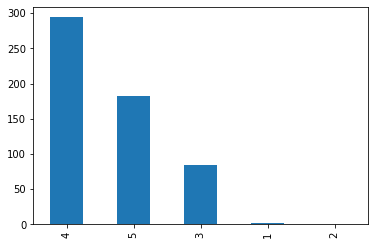

In [635]:
df_amazon_new["Ratings"].value_counts().plot(kind="bar")

In [643]:
df_amazon_new["Dates"].unique()

array(['2021-07-16T00:00:00.000000000', '2021-06-08T00:00:00.000000000',
       '2022-09-11T00:00:00.000000000', '2022-09-09T00:00:00.000000000',
       '2022-07-27T00:00:00.000000000', '2022-08-28T00:00:00.000000000',
       '2022-09-18T00:00:00.000000000', '2022-09-14T00:00:00.000000000',
       '2021-04-16T00:00:00.000000000', '2022-09-16T00:00:00.000000000',
       '2022-07-16T00:00:00.000000000', '2022-09-13T00:00:00.000000000',
       '2022-09-07T00:00:00.000000000', '2022-07-05T00:00:00.000000000',
       '2022-08-23T00:00:00.000000000', '2022-08-31T00:00:00.000000000',
       '2022-09-04T00:00:00.000000000', '2022-08-21T00:00:00.000000000',
       '2022-09-03T00:00:00.000000000', '2022-09-02T00:00:00.000000000',
       '2022-08-29T00:00:00.000000000', '2022-08-11T00:00:00.000000000',
       '2022-08-30T00:00:00.000000000', '2021-08-21T00:00:00.000000000',
       '2022-07-20T00:00:00.000000000', '2022-08-25T00:00:00.000000000',
       '2022-08-02T00:00:00.000000000', '2022-08-22

In [644]:
df_amazon_new.isnull().sum()

Dates      0
Reviews    0
Ratings    0
dtype: int64

In [645]:
df_amazon_new["Month"]=df_amazon_new.Dates.dt.month
df_amazon_new["Month"] = df_amazon_new["Month"].apply(lambda x : int(x))
df_amazon_new.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Dates,Reviews,Ratings,Month
0,2021-07-16,Since my OnePlus 7 conked off out of nowhere o...,5,7
1,2021-06-08,Bought this smartphone for a discount of 17500...,4,6
2,2022-09-11,"Got this phone for 15,499 on Amazon. It's a de...",4,9
3,2022-09-09,The phone is overall quite good but only one m...,4,9
4,2022-07-27,I am writing this review after one week of usa...,4,7


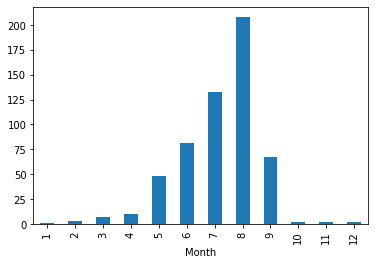

In [646]:
df_amazon_new.groupby("Month").agg("count")["Ratings"].plot.bar()

#**Flipkart**

In [636]:
df_flipkart["Ratings"].value_counts()

5    477
4    176
1    125
3     76
2     36
Name: Ratings, dtype: int64

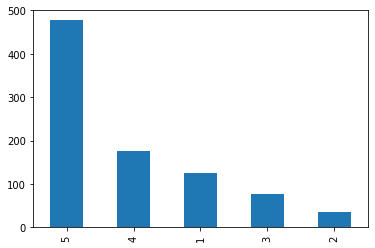

In [637]:
df_flipkart["Ratings"].value_counts().plot(kind="bar")

In [638]:
df_flipkart["Dates"].unique()

array(['2022-08-22T00:00:00.000000000', '2021-08-15T00:00:00.000000000',
       '2022-05-24T00:00:00.000000000', '2021-04-15T00:00:00.000000000',
       '2022-07-23T00:00:00.000000000', '2022-04-24T00:00:00.000000000',
       '2022-06-23T00:00:00.000000000', '2021-05-15T00:00:00.000000000',
       '2021-06-15T00:00:00.000000000', '2021-09-15T00:00:00.000000000',
       '2021-12-25T00:00:00.000000000', '2021-07-15T00:00:00.000000000',
       '2022-09-02T00:00:00.000000000', '2022-03-25T00:00:00.000000000',
       '2022-09-05T00:00:00.000000000', '2021-11-25T00:00:00.000000000',
       '2021-10-26T00:00:00.000000000', '2022-01-24T00:00:00.000000000',
       '2022-02-23T00:00:00.000000000', '2022-09-14T00:00:00.000000000',
       '2022-08-29T00:00:00.000000000', '2022-08-24T00:00:00.000000000',
       '2022-09-10T00:00:00.000000000', '2022-09-18T00:00:00.000000000',
       '2022-09-09T00:00:00.000000000', '2022-09-04T00:00:00.000000000',
       '2022-09-03T00:00:00.000000000', '2022-08-31

In [639]:
df_flipkart.isnull().sum()

Dates      13
Reviews     0
Ratings     0
dtype: int64

In [640]:
df_flipkart.dropna(inplace=True)

In [641]:
df_flipkart["Month"]=df_flipkart.Dates.dt.month
df_flipkart["Month"] = df_flipkart["Month"].apply(lambda x : int(x))
df_flipkart.head()

,Dates,Reviews,Ratings,Month
0,2022-08-22,Such a great phone in this price. In camera Su...,5,8
1,2021-08-15,I so happy ❤️😊❤️❤️ really amazing product in t...,5,8
2,2022-05-24,Best phone in the segment.Just keep in mind on...,5,5
3,2021-04-15,Pros : Build quality is good display quality I...,5,4
4,2022-05-24,It is very very nice and it's is Battery 🔋 per...,5,5


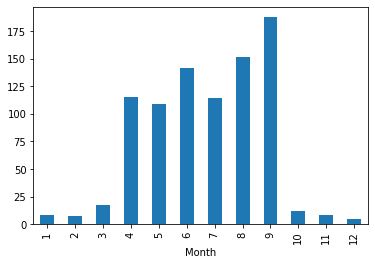

In [642]:
df_flipkart.groupby("Month").agg("count")["Ratings"].plot.bar()